# Enhancing PV Grid Management Through AC-Power Prediction

- Solar energy generation is rapidly emerging as one of the most promising and fastest-growing renewable sources of power worldwide. With the increasing demand for electrical energy in our daily lives, photovoltaic (PV) cells have become a key player in meeting these needs. PV cells, semiconductor devices, directly convert sunlight energy into electricity through the photovoltaic effect.

- A single solar cell, measuring 4 cm2, produces a voltage of 0.5 to 1 V and can generate 0.7W of power when exposed to sunlight. The most efficiently designed solar panels typically achieve a maximum efficiency of 25%. To enhance voltage and power generation, individual cells are interconnected, with some connected in series and others in parallel.

<p align="center">
  <img src="Standalone-Solar-Electric-Systems.jpg" alt="Solar Energy Generating System (SEGS)" width="600">
</p>

- PV modules are created by connecting numerous solar cells, and these modules are further linked to form a PV array suitable for applications ranging from small-scale to high-power generation. In a Solar Energy Generating System (SEGS) displayed above, solar panels convert solar energy into Direct Current (DC). This DC is then routed through an inverter to transform it into Alternating Current (AC), making it more compatible with transmission through centralized power grids.

**Dataset Description**

This data has been gathered at two solar power plants in India over a 34 day period. It has two pairs of files - each pair has one power generation dataset and one sensor readings dataset. The power generation datasets are gathered at the inverter level - each inverter has multiple lines of solar panels attached to it. The sensor data is gathered at a plant level - single array of sensors optimally placed at the plant.

### Import Libraries and Settings

In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

pd.options.display.max_columns = 100
pd.set_option('display.max_colwidth', None)
# pd.set_option('display.float_format', '{:.15f}'.format)

# Requirements
print('numpy version : ',np.__version__)
print('pandas version : ',pd.__version__)
print('seaborn version : ',sns.__version__)

numpy version :  1.26.4
pandas version :  2.2.0
seaborn version :  0.13.2


#### Load Dataset (Jupyter Notebook)

In [2]:
#Load power generation dataset
plant1_generation = pd.read_csv('Plant_1_Generation_Data.csv')
plant2_generation = pd.read_csv('Plant_2_Generation_Data.csv')

#Load sensor dataset
plant1_sensor = pd.read_csv('Plant_1_Weather_Sensor_Data.csv')
plant2_sensor = pd.read_csv('Plant_2_Weather_Sensor_Data.csv')

#### Load Dataset (Google Colab)

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
# #Load power generation dataset
# plant_1_generation = pd.read_csv('Plant_1_Generation_Data.csv')
# plant_2_generation = pd.read_csv('Plant_2_Generation_Data.csv')

# #Load sensor dataset
# plant_1_sensor = pd.read_csv('Plant_1_Weather_Sensor_Data.csv')
# plant_2_sensor = pd.read_csv('Plant_2_Weather_Sensor_Data.csv')

# Initial Data Understanding and Pre-Processing

In [5]:
plant1_generation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68778 entries, 0 to 68777
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATE_TIME    68778 non-null  object 
 1   PLANT_ID     68778 non-null  int64  
 2   SOURCE_KEY   68778 non-null  object 
 3   DC_POWER     68778 non-null  float64
 4   AC_POWER     68778 non-null  float64
 5   DAILY_YIELD  68778 non-null  float64
 6   TOTAL_YIELD  68778 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 3.7+ MB


In [6]:
plant2_generation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67698 entries, 0 to 67697
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATE_TIME    67698 non-null  object 
 1   PLANT_ID     67698 non-null  int64  
 2   SOURCE_KEY   67698 non-null  object 
 3   DC_POWER     67698 non-null  float64
 4   AC_POWER     67698 non-null  float64
 5   DAILY_YIELD  67698 non-null  float64
 6   TOTAL_YIELD  67698 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 3.6+ MB


In [7]:
plant1_sensor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3182 entries, 0 to 3181
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   DATE_TIME            3182 non-null   object 
 1   PLANT_ID             3182 non-null   int64  
 2   SOURCE_KEY           3182 non-null   object 
 3   AMBIENT_TEMPERATURE  3182 non-null   float64
 4   MODULE_TEMPERATURE   3182 non-null   float64
 5   IRRADIATION          3182 non-null   float64
dtypes: float64(3), int64(1), object(2)
memory usage: 149.3+ KB


In [8]:
plant2_sensor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3259 entries, 0 to 3258
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   DATE_TIME            3259 non-null   object 
 1   PLANT_ID             3259 non-null   int64  
 2   SOURCE_KEY           3259 non-null   object 
 3   AMBIENT_TEMPERATURE  3259 non-null   float64
 4   MODULE_TEMPERATURE   3259 non-null   float64
 5   IRRADIATION          3259 non-null   float64
dtypes: float64(3), int64(1), object(2)
memory usage: 152.9+ KB


## Files and Features Description

**A. Generation data : Solar power generation data for one plant gathered at 15 minutes intervals over a 34 days period.**

- **DATE_TIME**
  - Definition: Date and time for each observation. Observations recorded at 15 minute intervals.

- **PLANT_ID**
  - Definition: Number ID of the plant (this will be common for the entire file)

- **SOURCE_KEY**
  - Definition: Number ID of the inverter

- **DC_POWER**
  - Definition: Amount of DC power generated by the inverter (source_key) in this 15 minute interval. Units - kW.

- **AC_POWER**
  - Definition: Amount of AC power generated by the inverter (source_key) in this 15 minute interval. Units - kW.

- **DAILY_YIELD**
  - Definition: Daily yield is a cumulative sum of power generated on that day, till that point in time.

- **TOTAL_YIELD**
  - Definition: This is the total yield for the inverter till that point in time.

**B. Weather Sensor Data : Weather sensor data gathered for one solar plant every 15 minutes over a 34 days period.**

- **DATE_TIME**
  - Definition: Date and time for each observation. Observations recorded at 15 minute intervals.

- **PLANT_ID**
  - Definition: Number ID of the plant (this will be common for the entire file)

- **SOURCE_KEY**
  - Definition: Stands for the sensor panel id. This will be common for the entire file because there's only one sensor panel for the plant.

- **AMBIENT_TEMPERATURE**
  - Definition: This is the ambient temperature at the plant.

- **MODULE_TEMPERATURE**
  - Definition: There's a module (solar panel) attached to the sensor panel. This is the temperature reading for that module.

- **IRRADIATION**
  - Definition: Amount of irradiation for the 15 minute interval.

! Important notes regarding irradiance understanding : 

- Solar irradiance is the power per unit area (surface power density) received from the Sun in the form of electromagnetic radiation in the wavelength range of the measuring instrument. Solar irradiance is measured in watts per square metre (W/m2) in SI units.

- Solar irradiance is often integrated over a given time period in order to report the radiant energy emitted into the surrounding environment (joule per square metre, J/m2) during that time period. This integrated solar irradiance is called solar irradiation, solar exposure, solar insolation, or insolation.

- Irradiance may be measured in space or at the Earth's surface after atmospheric absorption and scattering. Irradiance in space is a function of distance from the Sun, the solar cycle, and cross-cycle changes. Irradiance on the Earth's surface additionally depends on the tilt of the measuring surface, the height of the Sun above the horizon, and atmospheric conditions.

- Since the strength of solar radiation reaching Earth is not evenly distributed across the electromagnetic spectrum, in addition to the total solar irradiance (TSI), measurement of the spectral solar irradiance (SSI) is also essential, especially as it interacts with different materials and processes on the Earth’s surface and atmosphere in different ways. SSI will allow scientists to adequately understand and resolve the relationships between the different wavelengths of sunlight and the properties of the materials they interact with, and can serve as the basis for the retrieval of geophysical quantities of various materials and phenomena by remote sensing, as well as the calibration of many of the instruments used for such measurements. SSI measured at the top of the atmosphere (TOA) and integrated across 200–2400 nm represents 97% of the TSI.

<p align="center">
  <img src="TSIS diagram_annotated.jpg" alt="Simulated spectral solar irradiance" width="600">
</p>

- Picture above is the Simulated spectral solar irradiance at the top of the atmosphere (ToA) and the Earth's surface. The different regions of the spectrum include: ultraviolet (UV), visible, near infrared (NIR), and shortwave infrared (SWIR). The range typically covered by SSI is indicated by the broken line at the top. The regions of spectrum where irradiance is absorbed by various atmospheric constituents are indicated, including: ozone (O3), oxygen (O2), water vapor (H2O), carbon dioxide (CO2), and methane (CH4). Graphics by Luke Ellison.

In [9]:
plant1_generation.head(25)

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,15-05-2020 00:00,4135001,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0
1,15-05-2020 00:00,4135001,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0
2,15-05-2020 00:00,4135001,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0
3,15-05-2020 00:00,4135001,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0
4,15-05-2020 00:00,4135001,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0
5,15-05-2020 00:00,4135001,VHMLBKoKgIrUVDU,0.0,0.0,0.0,7206408.0
6,15-05-2020 00:00,4135001,WRmjgnKYAwPKWDb,0.0,0.0,0.0,7028673.0
7,15-05-2020 00:00,4135001,ZnxXDlPa8U1GXgE,0.0,0.0,0.0,6522172.0
8,15-05-2020 00:00,4135001,ZoEaEvLYb1n2sOq,0.0,0.0,0.0,7098099.0
9,15-05-2020 00:00,4135001,adLQvlD726eNBSB,0.0,0.0,0.0,6271355.0


In [10]:
plant2_generation.head(25)

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,2020-05-15 00:00:00,4136001,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06
1,2020-05-15 00:00:00,4136001,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09
2,2020-05-15 00:00:00,4136001,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09
3,2020-05-15 00:00:00,4136001,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06
4,2020-05-15 00:00:00,4136001,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07
5,2020-05-15 00:00:00,4136001,LYwnQax7tkwH5Cb,0.0,0.0,1872.500000,1.794959e+09
6,2020-05-15 00:00:00,4136001,LlT2YUhhzqhg5Sw,0.0,0.0,1094.357143,2.825928e+08
7,2020-05-15 00:00:00,4136001,Mx2yZCDsyf6DPfv,0.0,0.0,5692.200000,2.453646e+06
8,2020-05-15 00:00:00,4136001,NgDl19wMapZy17u,0.0,0.0,1866.200000,1.115126e+08
9,2020-05-15 00:00:00,4136001,PeE6FRyGXUgsRhN,0.0,0.0,651.200000,1.348351e+09


In [11]:
plant1_sensor.head()

,DATE_TIME,PLANT_ID,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,4135001,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0
1,2020-05-15 00:15:00,4135001,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0
2,2020-05-15 00:30:00,4135001,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0
3,2020-05-15 00:45:00,4135001,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0
4,2020-05-15 01:00:00,4135001,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0


In [12]:
plant2_sensor.head()

,DATE_TIME,PLANT_ID,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,4136001,iq8k7ZNt4Mwm3w0,27.004764,25.060789,0.0
1,2020-05-15 00:15:00,4136001,iq8k7ZNt4Mwm3w0,26.880811,24.421869,0.0
2,2020-05-15 00:30:00,4136001,iq8k7ZNt4Mwm3w0,26.682055,24.427290,0.0
3,2020-05-15 00:45:00,4136001,iq8k7ZNt4Mwm3w0,26.500589,24.420678,0.0
4,2020-05-15 01:00:00,4136001,iq8k7ZNt4Mwm3w0,26.596148,25.088210,0.0


Just from these information, there are some useful insight to this data that understanding it could make it easier for further analysis and feature transformation, they are :

- Date feature have the wrong format should be in datetime instead of object.
- In generation data, the recorded data is not aggregated on 15 minute interval but still on individual data recording, will have to change that later. This is not the case for sensor data.
- Although group by not actually needed for sensor data, it's good to also do group by on sensor data to remove PLANT_ID and SOURCE_KEY (we could also do this just by casually dropping the columns) since we wont be needing those for analysis especially later on making model

In [13]:
#Aggregate plant 1 generation data by datetime
plant1_generation_agg = plant1_generation.groupby('DATE_TIME')[['DC_POWER','AC_POWER', 'DAILY_YIELD','TOTAL_YIELD']].agg('sum').reset_index()
plant1_generation_agg

,DATE_TIME,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,01-06-2020 00:00,0.0,0.0,5407.250000,153519480.0
1,01-06-2020 00:15,0.0,0.0,0.000000,153519480.0
2,01-06-2020 00:30,0.0,0.0,0.000000,153519480.0
3,01-06-2020 00:45,0.0,0.0,0.000000,153519480.0
4,01-06-2020 01:00,0.0,0.0,0.000000,153519480.0
...,...,...,...,...,...
3153,31-05-2020 22:45,0.0,0.0,125291.000000,153519480.0
3154,31-05-2020 23:00,0.0,0.0,125291.000000,153519480.0
3155,31-05-2020 23:15,0.0,0.0,125291.000000,153519480.0
3156,31-05-2020 23:30,0.0,0.0,125291.000000,153519480.0


In [14]:
#Aggregate plant 2 generation data by datetime
plant2_generation_agg = plant2_generation.groupby('DATE_TIME')[['DC_POWER','AC_POWER', 'DAILY_YIELD','TOTAL_YIELD']].agg('sum').reset_index()
plant2_generation_agg

,DATE_TIME,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,2020-05-15 00:00:00,0.0,0.0,48899.938095,1.418960e+10
1,2020-05-15 00:15:00,0.0,0.0,28401.000000,1.418960e+10
2,2020-05-15 00:30:00,0.0,0.0,28401.000000,1.418960e+10
3,2020-05-15 00:45:00,0.0,0.0,28401.000000,1.418960e+10
4,2020-05-15 01:00:00,0.0,0.0,26516.000000,1.418960e+10
...,...,...,...,...,...
3254,2020-06-17 22:45:00,0.0,0.0,93040.000000,1.419408e+10
3255,2020-06-17 23:00:00,0.0,0.0,93040.000000,1.419408e+10
3256,2020-06-17 23:15:00,0.0,0.0,93040.000000,1.419408e+10
3257,2020-06-17 23:30:00,0.0,0.0,93040.000000,1.419408e+10


In [15]:
#Aggregate plant 1 sensor data by datetime
plant1_sensor_agg = plant1_sensor.groupby('DATE_TIME')[['AMBIENT_TEMPERATURE','MODULE_TEMPERATURE', 'IRRADIATION']].agg('sum').reset_index()
plant1_sensor_agg

,DATE_TIME,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,25.184316,22.857507,0.0
1,2020-05-15 00:15:00,25.084589,22.761668,0.0
2,2020-05-15 00:30:00,24.935753,22.592306,0.0
3,2020-05-15 00:45:00,24.846130,22.360852,0.0
4,2020-05-15 01:00:00,24.621525,22.165423,0.0
...,...,...,...,...
3177,2020-06-17 22:45:00,22.150570,21.480377,0.0
3178,2020-06-17 23:00:00,22.129816,21.389024,0.0
3179,2020-06-17 23:15:00,22.008275,20.709211,0.0
3180,2020-06-17 23:30:00,21.969495,20.734963,0.0


In [16]:
#Aggregate plant 2 sensor data by datetime
plant2_sensor_agg = plant2_sensor.groupby('DATE_TIME')[['AMBIENT_TEMPERATURE','MODULE_TEMPERATURE', 'IRRADIATION']].agg('sum').reset_index()
plant2_sensor_agg

,DATE_TIME,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,27.004764,25.060789,0.0
1,2020-05-15 00:15:00,26.880811,24.421869,0.0
2,2020-05-15 00:30:00,26.682055,24.427290,0.0
3,2020-05-15 00:45:00,26.500589,24.420678,0.0
4,2020-05-15 01:00:00,26.596148,25.088210,0.0
...,...,...,...,...
3254,2020-06-17 22:45:00,23.511703,22.856201,0.0
3255,2020-06-17 23:00:00,23.482282,22.744190,0.0
3256,2020-06-17 23:15:00,23.354743,22.492245,0.0
3257,2020-06-17 23:30:00,23.291048,22.373909,0.0


In [17]:
#Checking amount of missing values
datasets = [plant1_generation_agg, plant2_generation_agg, plant1_sensor, plant2_sensor]

for dataset in datasets :
    print(dataset.isnull().any())

DATE_TIME      False
DC_POWER       False
AC_POWER       False
DAILY_YIELD    False
TOTAL_YIELD    False
dtype: bool
DATE_TIME      False
DC_POWER       False
AC_POWER       False
DAILY_YIELD    False
TOTAL_YIELD    False
dtype: bool
DATE_TIME              False
PLANT_ID               False
SOURCE_KEY             False
AMBIENT_TEMPERATURE    False
MODULE_TEMPERATURE     False
IRRADIATION            False
dtype: bool
DATE_TIME              False
PLANT_ID               False
SOURCE_KEY             False
AMBIENT_TEMPERATURE    False
MODULE_TEMPERATURE     False
IRRADIATION            False
dtype: bool


In [18]:
#Checking amount of duplicated values
for dataset in datasets :
    print(dataset.duplicated().any())

False
False
False
False


There are no missing or duplicated values in the dataset

In [19]:
#Convert DATE_TIME feature into datetime format

#Plant 1 generation data
plant1_generation_agg['DATE_TIME'] = pd.to_datetime(plant1_generation_agg['DATE_TIME'], format="%d-%m-%Y %H:%M")
plant1_generation_agg['TIME'] = plant1_generation_agg['DATE_TIME'].dt.time
plant1_generation_agg['DATE'] = pd.to_datetime(plant1_generation_agg['DATE_TIME'].dt.date)

#Plant 2 generation data
plant2_generation_agg['DATE_TIME'] = pd.to_datetime(plant2_generation_agg['DATE_TIME'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
plant2_generation_agg['TIME'] = plant2_generation_agg['DATE_TIME'].dt.time
plant2_generation_agg['DATE'] = pd.to_datetime(plant2_generation_agg['DATE_TIME'].dt.date)

#Plant 1 sensor data
plant1_sensor_agg['DATE_TIME'] = pd.to_datetime(plant1_sensor_agg['DATE_TIME'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
plant1_sensor_agg['TIME'] = plant1_sensor_agg['DATE_TIME'].dt.time 
plant1_sensor_agg['DATE'] = pd.to_datetime(plant1_sensor_agg['DATE_TIME'].dt.date)

#Plant 2 sensor data
plant2_sensor_agg['DATE_TIME'] = pd.to_datetime(plant2_sensor_agg['DATE_TIME'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
plant2_sensor_agg['TIME'] = plant2_sensor_agg['DATE_TIME'].dt.time 
plant2_sensor_agg['DATE'] = pd.to_datetime(plant2_sensor_agg['DATE_TIME'].dt.date)

In [20]:
# # Initial data transformation :  converting column name to lowercase
# for dataset in datasets :
#     dataset.columns = dataset.columns.str.lower()

# Further EDA on Generation Data (Univariate and Bivariate)

In [21]:
#Describe columns on plant 1
plant1_generation_agg.describe().transpose()

,count,mean,min,25%,50%,75%,max,std
DATE_TIME,3158,2020-06-01 06:42:44.344521728,2020-05-15 00:00:00,2020-05-23 23:18:45,2020-06-01 12:37:30,2020-06-09 17:56:15,2020-06-17 23:45:00,NaN
DC_POWER,3158.0,68547.713729,0.0,0.0,8515.285714,140386.504463,298937.78571,88044.612181
AC_POWER,3158.0,6703.628149,0.0,0.0,823.033036,13750.606696,29150.212499,8603.120476
DAILY_YIELD,3158.0,71782.817545,0.0,90.75,66068.0,129398.5,193770.0,65974.417997
TOTAL_YIELD,3158.0,151989182.227813,26540040.0,152097608.23175,153531986.983,154994999.624,156142755.0,10616697.925153
DATE,3158,2020-05-31 18:42:38.074730752,2020-05-15 00:00:00,2020-05-23 00:00:00,2020-06-01 00:00:00,2020-06-09 00:00:00,2020-06-17 00:00:00,NaN


In [22]:
#Describe columns on plant 2
plant2_generation_agg.describe().transpose()

,count,mean,min,25%,50%,75%,max,std
DATE_TIME,3259,2020-06-01 00:04:35.053697536,2020-05-15 00:00:00,2020-05-23 12:07:30,2020-06-01 00:00:00,2020-06-09 12:07:30,2020-06-17 23:45:00,NaN
DC_POWER,3259.0,5124.648465,0.0,0.0,494.427143,11048.773333,26630.506667,6462.118509
AC_POWER,3259.0,5011.974903,0.0,0.0,477.536667,10795.727619,25979.760476,6317.872611
DAILY_YIELD,3259.0,68443.535809,0.0,18698.245238,73875.0,110975.22381,162876.0,48505.077129
TOTAL_YIELD,3259.0,13688016043.790148,0.0,13359126745.700001,14190162599.714289,14193115082.866667,14194078746.0,1245967821.466597
DATE,3259,2020-05-31 12:12:35.569193216,2020-05-15 00:00:00,2020-05-23 00:00:00,2020-06-01 00:00:00,2020-06-09 00:00:00,2020-06-17 00:00:00,NaN


Number of inverter in Plant 1 : 22
Number of inverter in Plant 2 : 22


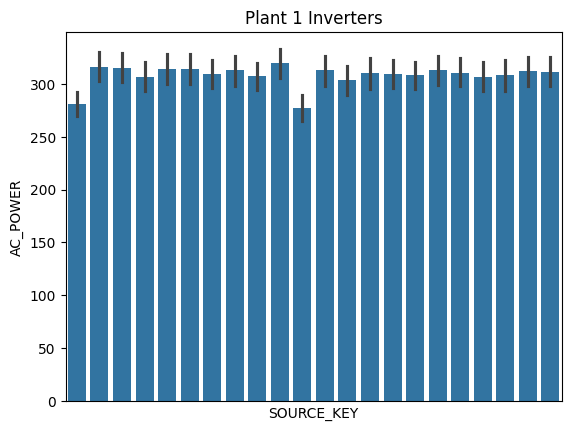

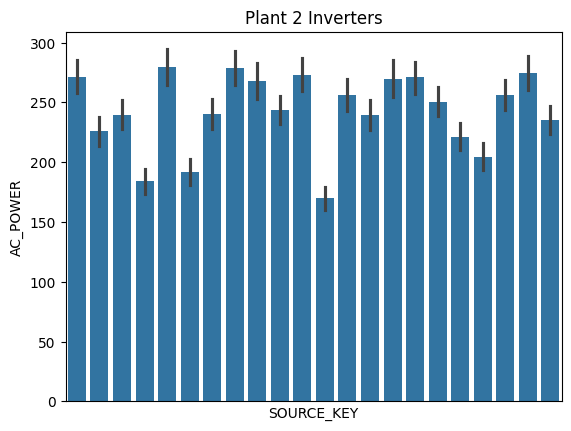

In [23]:
#Check for faulty in inverters/modules

print(f'Number of inverter in Plant 1 : {plant1_generation['SOURCE_KEY'].nunique()}')
print(f'Number of inverter in Plant 2 : {plant2_generation['SOURCE_KEY'].nunique()}')

sns.barplot(x='SOURCE_KEY', y='AC_POWER', data=plant1_generation)
plt.title('Plant 1 Inverters')
plt.xticks([])
plt.show()

sns.barplot(x='SOURCE_KEY', y='AC_POWER', data=plant2_generation)
plt.title('Plant 2 Inverters')
plt.xticks([])
plt.show()

The inverters in Plant 1 exhibit consistent outputs, whereas those in Plant 2 show fluctuations. This variance in Plant 2's output could potentially be attributed to malfunctioning inverters, assuming the solar modules are in good working condition.

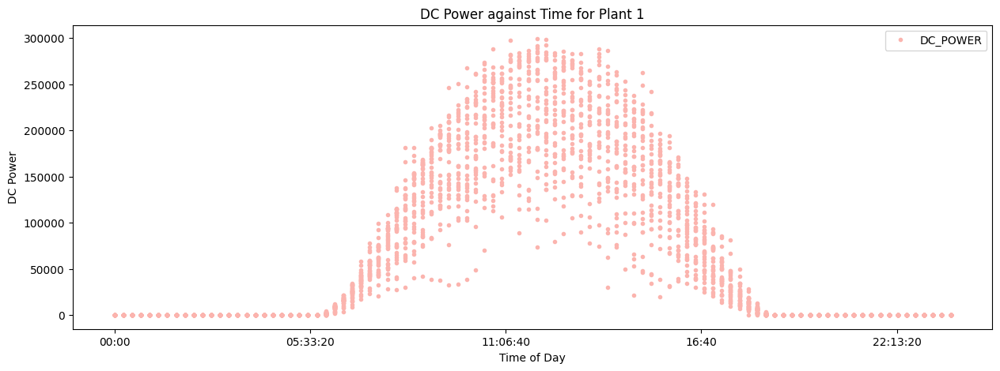

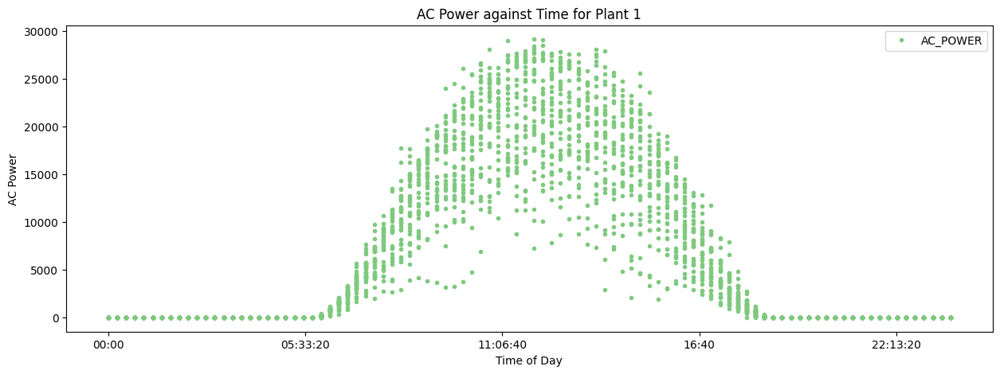

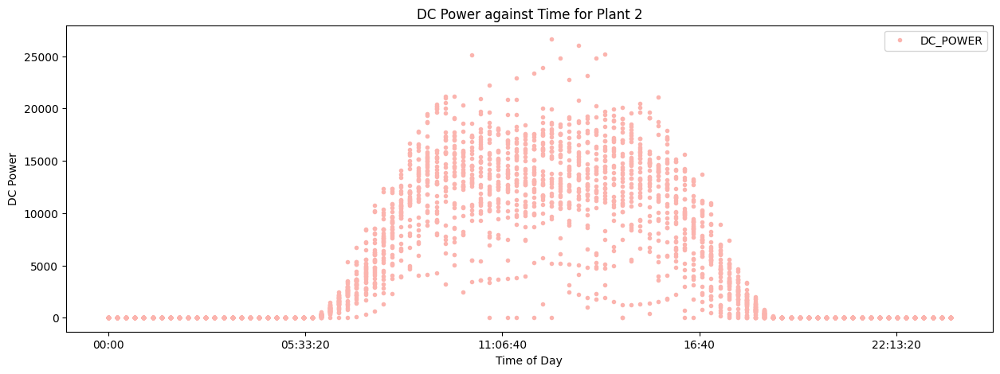

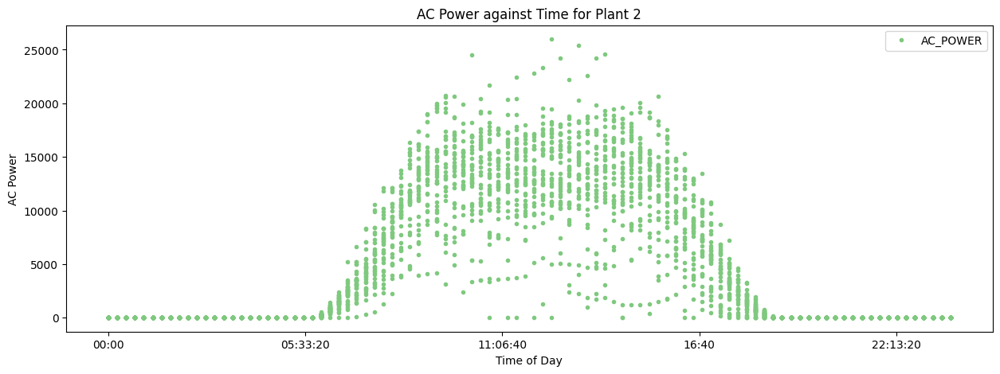

In [24]:
#Check power generation againts time in a day

plant1_generation_agg.plot(x= 'TIME', y='DC_POWER', style='.', figsize = (15, 5), colormap='Pastel1')
plt.ylabel('DC Power')
plt.xlabel('Time of Day')
plt.title('DC Power against Time for Plant 1')
plt.show()

plant1_generation_agg.plot(x= 'TIME', y='AC_POWER', style='.', figsize = (15, 5), colormap='Accent') 
plt.ylabel('AC Power')
plt.xlabel('Time of Day')
plt.title('AC Power against Time for Plant 1')
plt.show()

plant2_generation_agg.plot(x= 'TIME', y='DC_POWER', style='.', figsize = (15, 5), colormap='Pastel1')
plt.ylabel('DC Power')
plt.xlabel('Time of Day')
plt.title('DC Power against Time for Plant 2')
plt.show()

plant2_generation_agg.plot(x= 'TIME', y='AC_POWER', style='.', figsize = (15, 5), colormap='Accent') 
plt.ylabel('AC Power')
plt.xlabel('Time of Day')
plt.title('AC Power against Time for Plant 2')
plt.show()

- The generation of power relies on sunlight, commencing around 5:40 in the morning and concluding approximately at 6:00 in the evening. The availability of sunlight is determined by its intensity and wavelength upon reaching the PV cells. Despite sunlight still being present at 6:00 PM, it consists of diffused and scattered sunlight lacking the requisite wavelength for power generation.

- Plant 2 demonstrates increased variations in AC and DC power values, indicating that the issue may not lie with faulty inverters but rather with the modules themselves.

- We can also see that overall, the power generated from Plant 1 have higher values compared to Plant 2, we will check that down below

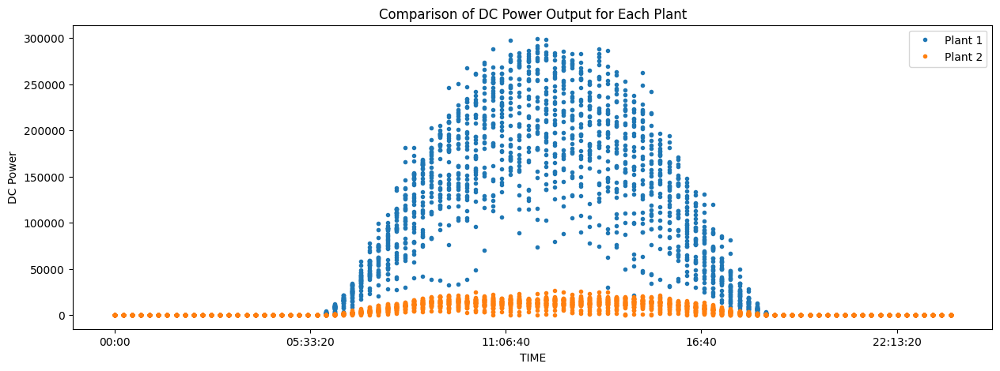

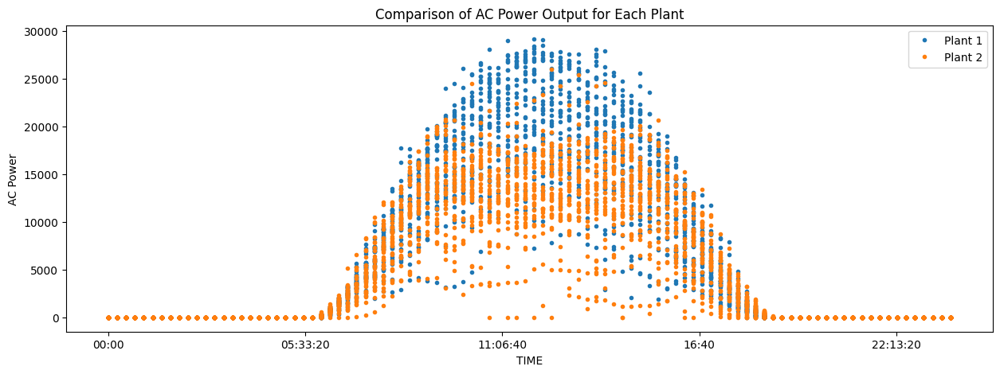

In [25]:
# DC output from solar module
fig, ax = plt.subplots(figsize=(15, 5))
plant1_generation_agg.plot(x='TIME', y='DC_POWER', style='.', label='Plant 1', ax=ax)
plant2_generation_agg.plot(x='TIME', y='DC_POWER', style='.', label='Plant 2', ax=ax)
plt.title('Comparison of DC Power Output for Each Plant')
plt.ylabel('DC Power')
plt.show()

# AC output from inverter
fig, ax = plt.subplots(figsize=(15, 5))
plant1_generation_agg.plot(x='TIME', y='AC_POWER', figsize=(15,5), legend=True, style='.', label='Plant 1', ax=ax)
plant2_generation_agg.plot(x='TIME', y='AC_POWER', legend=True, style='.', label='Plant 2', ax=ax)
plt.title('Comparison of AC Power Output for Each Plant')
plt.ylabel('AC Power')
plt.show()

- Plant 2 exhibits lower **DC power** output from its solar modules compared to Plant 1, nearly ten times less.
- Despite the more erratic nature of the **AC power** output from Plant 2, the levels of AC power output from both plants are similar.

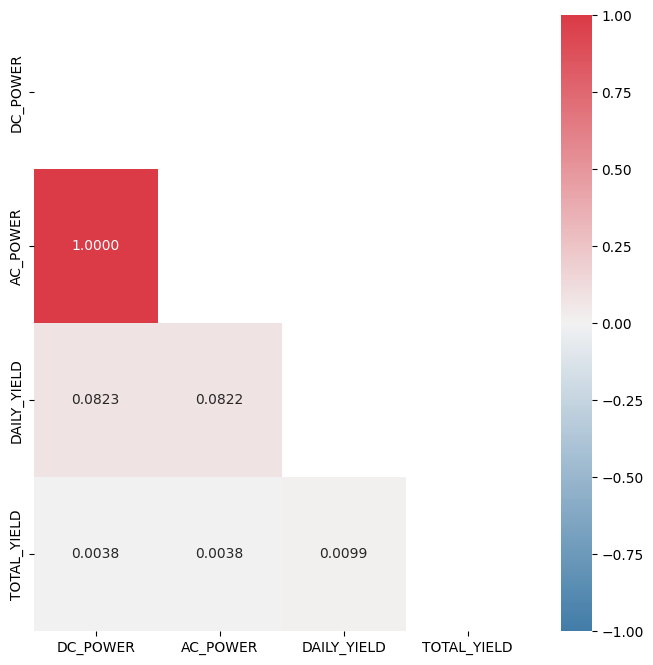

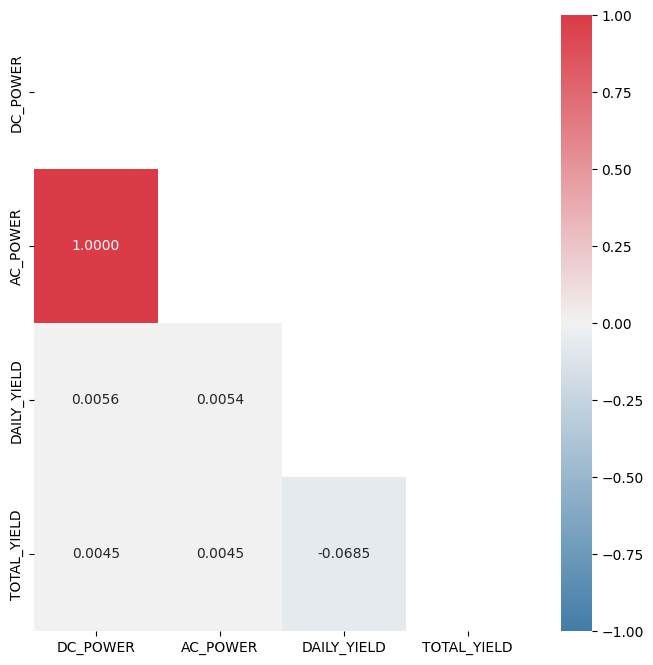

In [26]:
# Heatmap (corr pearson)

# Make new dataframe without ID column for each plant
gen1_corr = plant1_generation.drop('PLANT_ID', axis=1).corr(numeric_only=True, method='pearson')
gen2_corr = plant2_generation.drop('PLANT_ID', axis=1).corr(numeric_only=True, method='pearson')

# Plot correlation heatmap
gen1_mask = np.triu(np.ones_like(gen1_corr, dtype=bool))
gen2_mask = np.triu(np.ones_like(gen2_corr, dtype=bool))

plt.figure(figsize=(8,8))
cmap_custom = sns.diverging_palette(240, 10, as_cmap=True)
sns.heatmap(data = gen1_corr, cmap=cmap_custom, mask=gen1_mask, annot=True, fmt='.4f', vmin=-1, vmax=1)
plt.show()

plt.figure(figsize=(8,8))
cmap_custom = sns.diverging_palette(240, 10, as_cmap=True)
sns.heatmap(data = gen2_corr, cmap=cmap_custom, mask=gen2_mask, annot=True, fmt='.4f', vmin=-1, vmax=1)
plt.show()

* Correlation coefficient between DAILY_YIELD and output (AC_POWER and DC_POWER) for Plant 1 is higher than Plant 2.

# Further EDA on Sensor Data (Univariate and Bivariate)

In [27]:
plant1_sensor_agg

,DATE_TIME,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,TIME,DATE
0,2020-05-15 00:00:00,25.184316,22.857507,0.0,00:00:00,2020-05-15
1,2020-05-15 00:15:00,25.084589,22.761668,0.0,00:15:00,2020-05-15
2,2020-05-15 00:30:00,24.935753,22.592306,0.0,00:30:00,2020-05-15
3,2020-05-15 00:45:00,24.846130,22.360852,0.0,00:45:00,2020-05-15
4,2020-05-15 01:00:00,24.621525,22.165423,0.0,01:00:00,2020-05-15
...,...,...,...,...,...,...
3177,2020-06-17 22:45:00,22.150570,21.480377,0.0,22:45:00,2020-06-17
3178,2020-06-17 23:00:00,22.129816,21.389024,0.0,23:00:00,2020-06-17
3179,2020-06-17 23:15:00,22.008275,20.709211,0.0,23:15:00,2020-06-17
3180,2020-06-17 23:30:00,21.969495,20.734963,0.0,23:30:00,2020-06-17


In [28]:
plant2_sensor_agg

,DATE_TIME,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,TIME,DATE
0,2020-05-15 00:00:00,27.004764,25.060789,0.0,00:00:00,2020-05-15
1,2020-05-15 00:15:00,26.880811,24.421869,0.0,00:15:00,2020-05-15
2,2020-05-15 00:30:00,26.682055,24.427290,0.0,00:30:00,2020-05-15
3,2020-05-15 00:45:00,26.500589,24.420678,0.0,00:45:00,2020-05-15
4,2020-05-15 01:00:00,26.596148,25.088210,0.0,01:00:00,2020-05-15
...,...,...,...,...,...,...
3254,2020-06-17 22:45:00,23.511703,22.856201,0.0,22:45:00,2020-06-17
3255,2020-06-17 23:00:00,23.482282,22.744190,0.0,23:00:00,2020-06-17
3256,2020-06-17 23:15:00,23.354743,22.492245,0.0,23:15:00,2020-06-17
3257,2020-06-17 23:30:00,23.291048,22.373909,0.0,23:30:00,2020-06-17


<Figure size 1500x800 with 0 Axes>

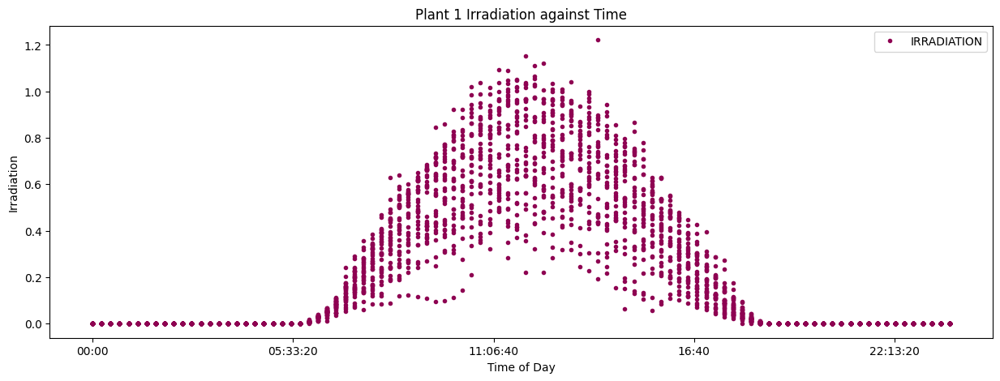

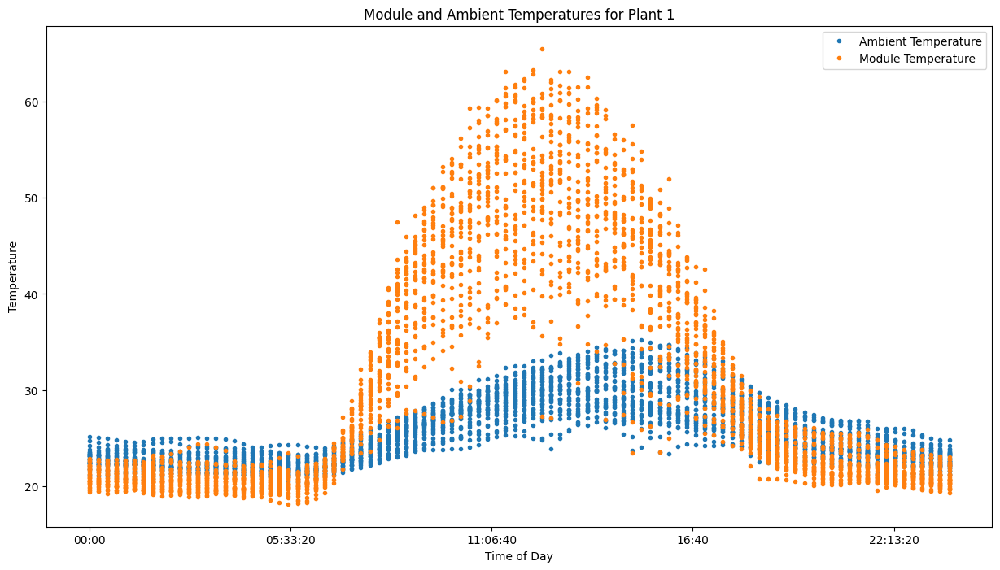

<Figure size 1500x800 with 0 Axes>

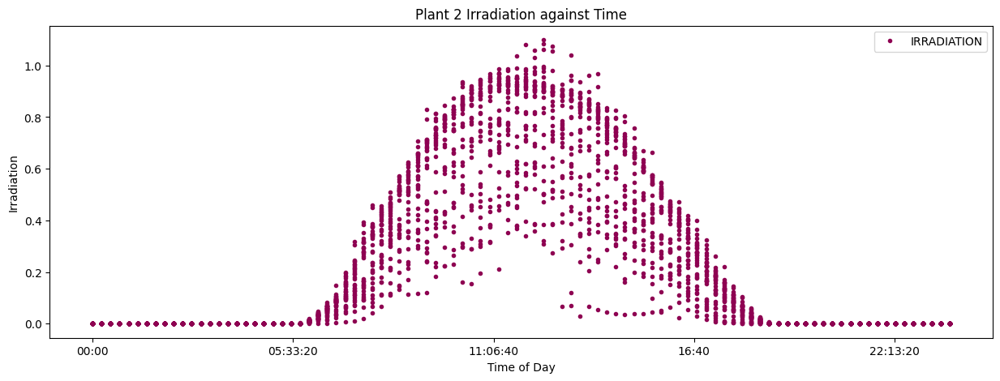

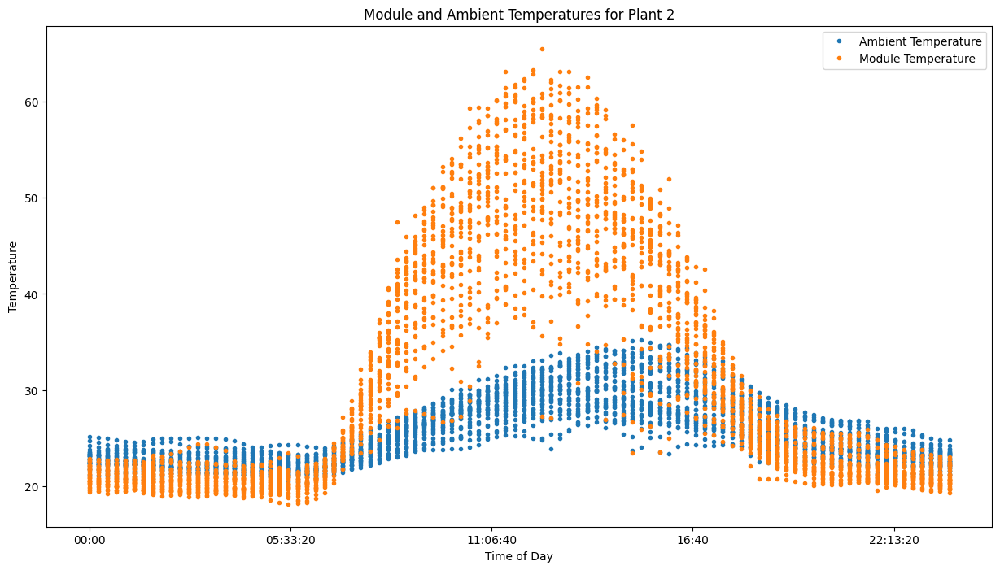

In [29]:
#Check Irradiation, Ambient Temperature, and Module Tmeperature againts time in a day for each Plant

#Plant 1

##Irradiation by time
plt.figure(figsize=(15,8))
plant1_sensor_agg.plot(x= 'TIME', y='IRRADIATION', style='.', figsize = (15, 5), colormap='PiYG')
plt.ylabel('Irradiation')
plt.xlabel('Time of Day')
plt.title('Plant 1 Irradiation against Time')
plt.show()

##Ambient and Module Temperature by time
fig, ax = plt.subplots(figsize=(15, 8))
plant1_sensor_agg.plot(x='TIME', y='AMBIENT_TEMPERATURE', style='.', label='Ambient Temperature', ax=ax)
plant1_sensor_agg.plot(x='TIME', y='MODULE_TEMPERATURE', style='.', label='Module Temperature', ax=ax)
plt.title('Module and Ambient Temperatures for Plant 1')
plt.xlabel('Time of Day')
plt.ylabel('Temperature')
plt.show()

#Plant 2

##Irradiation by time
plt.figure(figsize=(15,8))
plant2_sensor_agg.plot(x= 'TIME', y='IRRADIATION', style='.', figsize = (15, 5), colormap='PiYG')
plt.ylabel('Irradiation')
plt.xlabel('Time of Day')
plt.title('Plant 2 Irradiation against Time')
plt.show()

##Ambient and Module Temperature by time
fig, ax = plt.subplots(figsize=(15, 8))
plant1_sensor_agg.plot(x='TIME', y='AMBIENT_TEMPERATURE', style='.', label='Ambient Temperature', ax=ax)
plant1_sensor_agg.plot(x='TIME', y='MODULE_TEMPERATURE', style='.', label='Module Temperature', ax=ax)
plt.title('Module and Ambient Temperatures for Plant 2')
plt.xlabel('Time of Day')
plt.ylabel('Temperature')
plt.show()

* Ambient temperature goes down much later in the evening as compared to module temperature. This could mean that the specific heat capacity of the module is much lower than the specific heat capacity of the surrounding atmosphere making it took more energy to cool it down

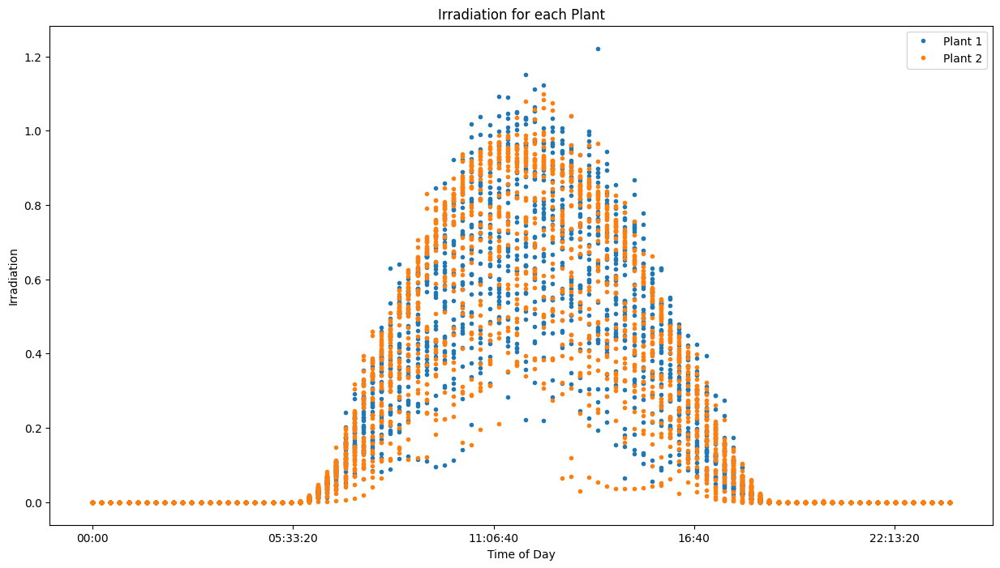

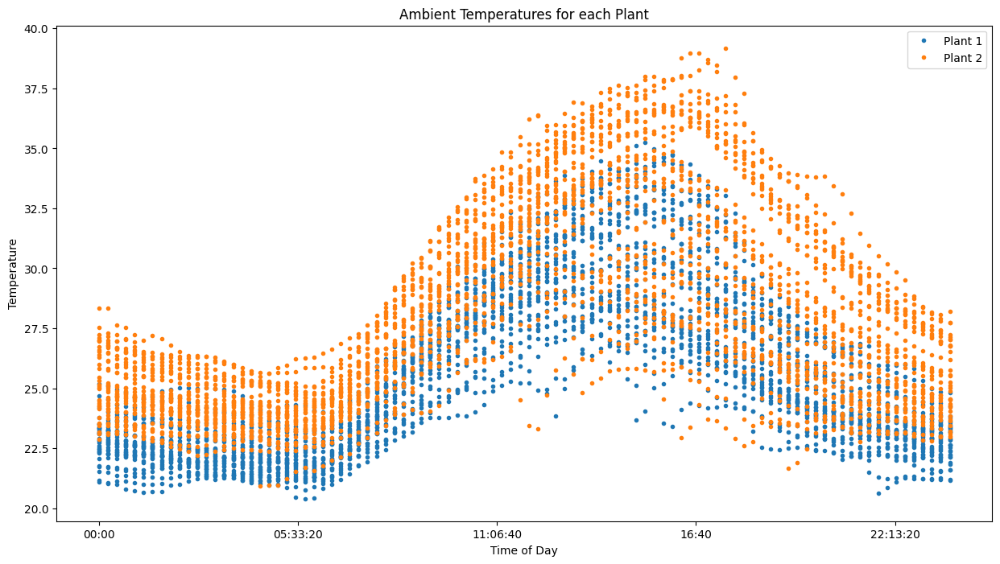

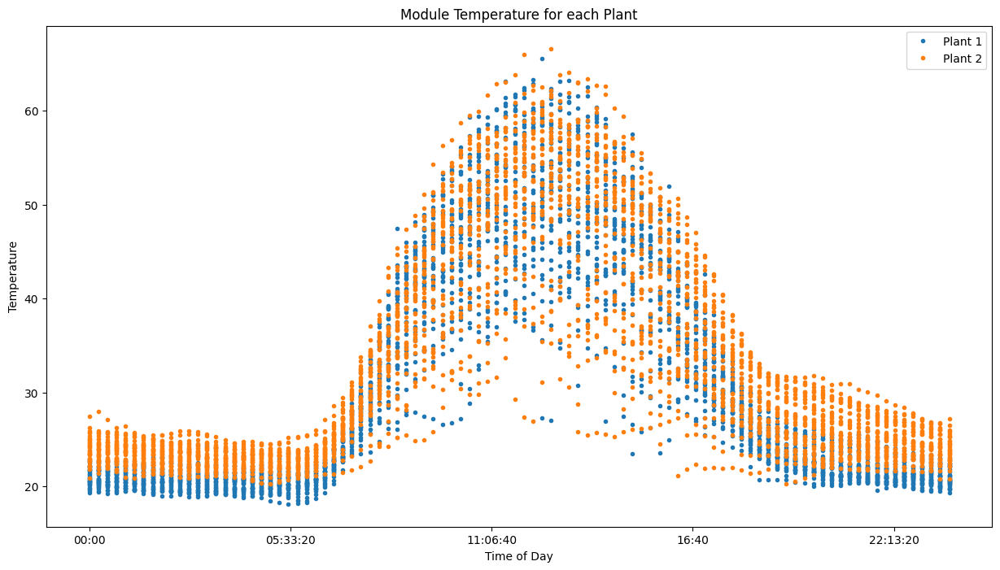

In [30]:
#Comparison of Irradiation, Ambient Temperature, and Module Tmeperature againts time in a day for each Plant

##Irradiation by time
fig, ax = plt.subplots(figsize=(15, 8))
plant1_sensor_agg.plot(x='TIME', y='IRRADIATION', style='.', label='Plant 1', ax=ax)
plant2_sensor_agg.plot(x='TIME', y='IRRADIATION', style='.', label='Plant 2', ax=ax)
plt.title('Irradiation for each Plant')
plt.xlabel('Time of Day')
plt.ylabel('Irradiation')
plt.show()

##Ambient Temperature by time
fig, ax = plt.subplots(figsize=(15, 8))
plant1_sensor_agg.plot(x='TIME', y='AMBIENT_TEMPERATURE', style='.', label='Plant 1', ax=ax)
plant2_sensor_agg.plot(x='TIME', y='AMBIENT_TEMPERATURE', style='.', label='Plant 2', ax=ax)
plt.title('Ambient Temperatures for each Plant')
plt.xlabel('Time of Day')
plt.ylabel('Temperature')
plt.show()

##Module Temperature by time
fig, ax = plt.subplots(figsize=(15, 8))
plant1_sensor_agg.plot(x='TIME', y='MODULE_TEMPERATURE', style='.', label='Plant 1', ax=ax)
plant2_sensor_agg.plot(x='TIME', y='MODULE_TEMPERATURE', style='.', label='Plant 2', ax=ax)
plt.title('Module Temperature for each Plant')
plt.xlabel('Time of Day')
plt.ylabel('Temperature')
plt.show()

* Plant 2 has more extreme values/outliers in irradiation
* Plant 2 has higher ambient temperature values across all hours

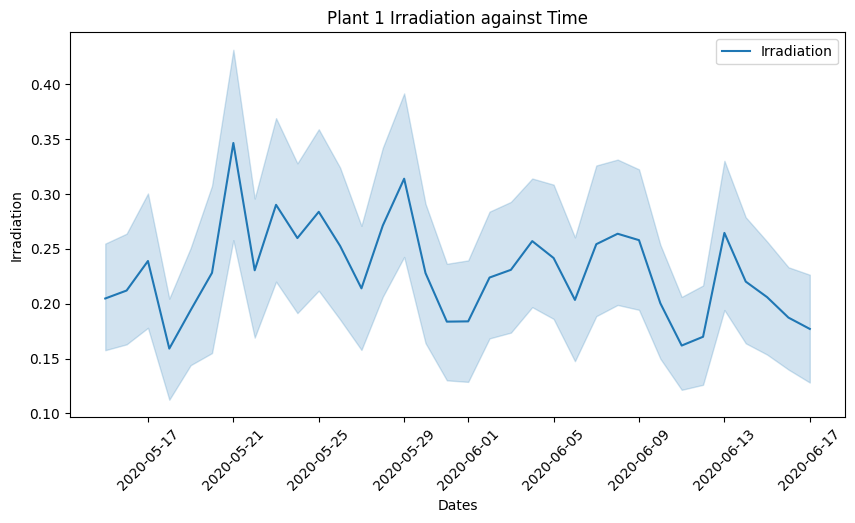

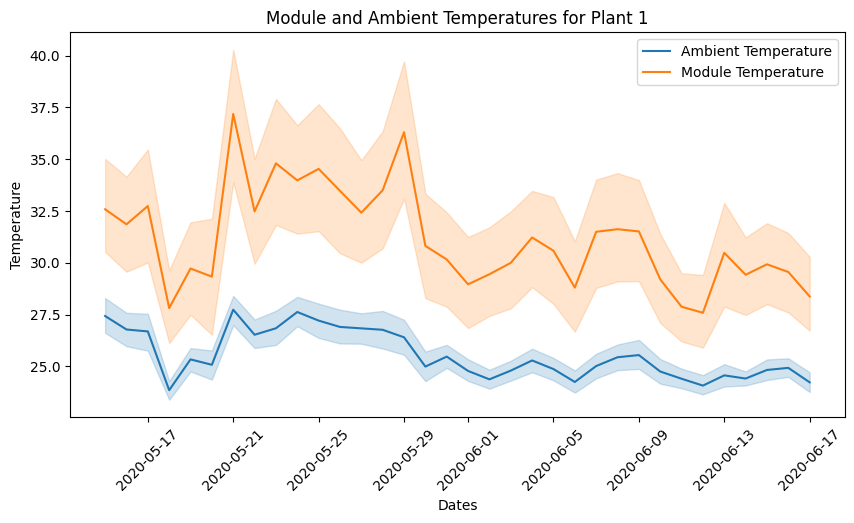

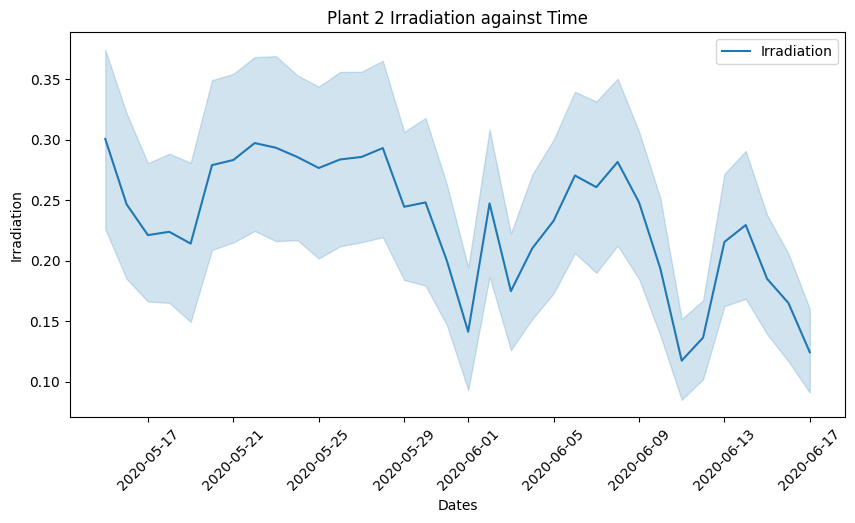

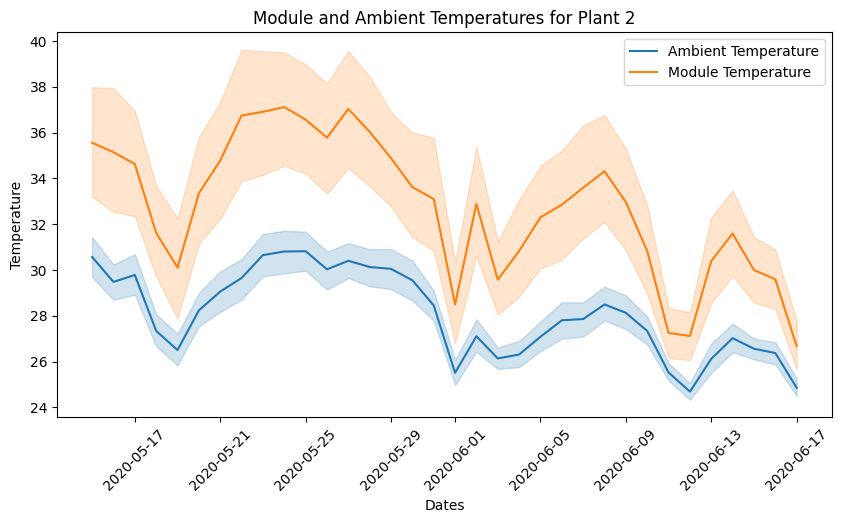

In [31]:
#Check Irradiation, Ambient Temperature, and Module Tmeperature againts time in a day for each Plant

#Plant 1

##Irradiation by dates
plt.figure(figsize=(10,5))
sns.lineplot(data=plant1_sensor_agg, x='DATE', y='IRRADIATION', err_style='band', label='Irradiation')
plt.ylabel('Irradiation')
plt.xlabel('Dates')
plt.xticks(rotation=45)
plt.title('Plant 1 Irradiation against Time')
plt.show()

##Ambient and Module Temperature by dates
fig, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(data=plant1_sensor_agg, x='DATE', y='AMBIENT_TEMPERATURE', err_style='band', label='Ambient Temperature')
sns.lineplot(data=plant1_sensor_agg, x='DATE', y='MODULE_TEMPERATURE', err_style='band', label='Module Temperature')
plt.title('Module and Ambient Temperatures for Plant 1')
plt.xlabel('Dates')
plt.xticks(rotation=45)
plt.ylabel('Temperature')
plt.show()

#Plant 2

##Irradiation by dates
plt.figure(figsize=(10,5))
sns.lineplot(data=plant2_sensor_agg, x='DATE', y='IRRADIATION', err_style='band', label='Irradiation')
plt.ylabel('Irradiation')
plt.xlabel('Dates')
plt.xticks(rotation=45)
plt.title('Plant 2 Irradiation against Time')
plt.show()

##Ambient and Module Temperature by dates
fig, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(data=plant2_sensor_agg, x='DATE', y='AMBIENT_TEMPERATURE', err_style='band', label='Ambient Temperature')
sns.lineplot(data=plant2_sensor_agg, x='DATE', y='MODULE_TEMPERATURE', err_style='band', label='Module Temperature')
plt.title('Module and Ambient Temperatures for Plant 2')
plt.xlabel('Dates')
plt.xticks(rotation=45)
plt.ylabel('Temperature')
plt.show()

As we can see that module temperature is always higher thatn ambient temperature

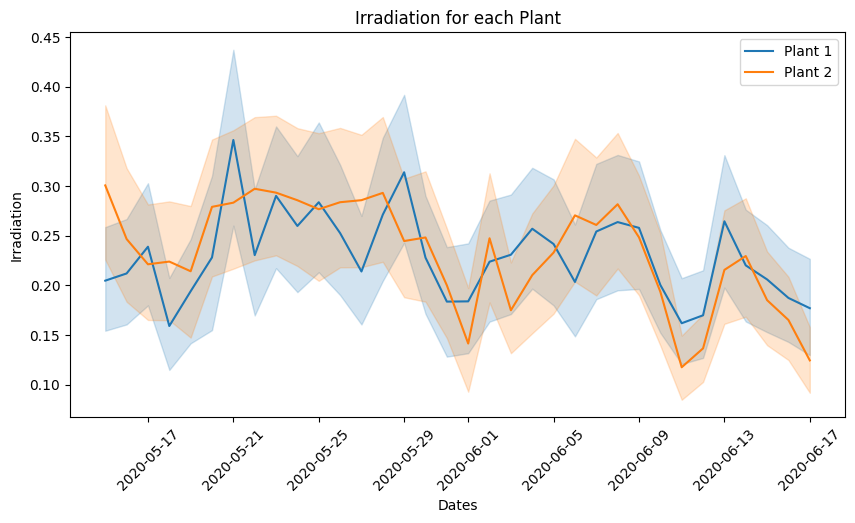

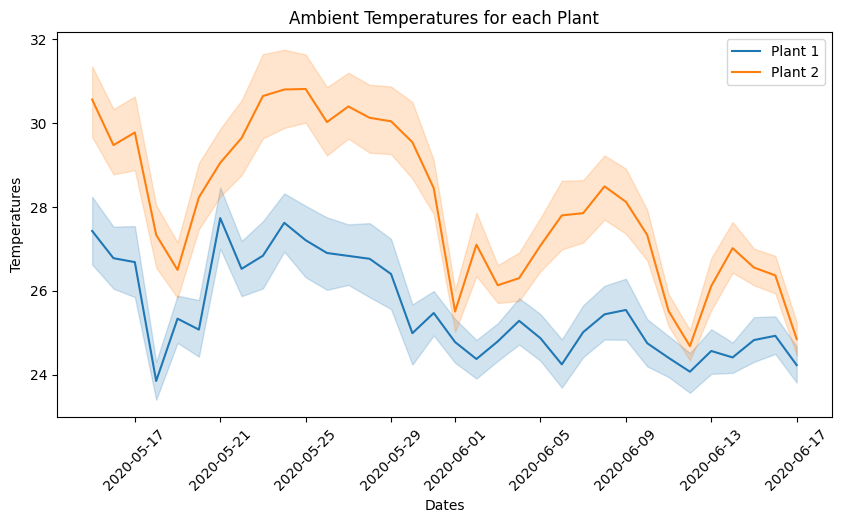

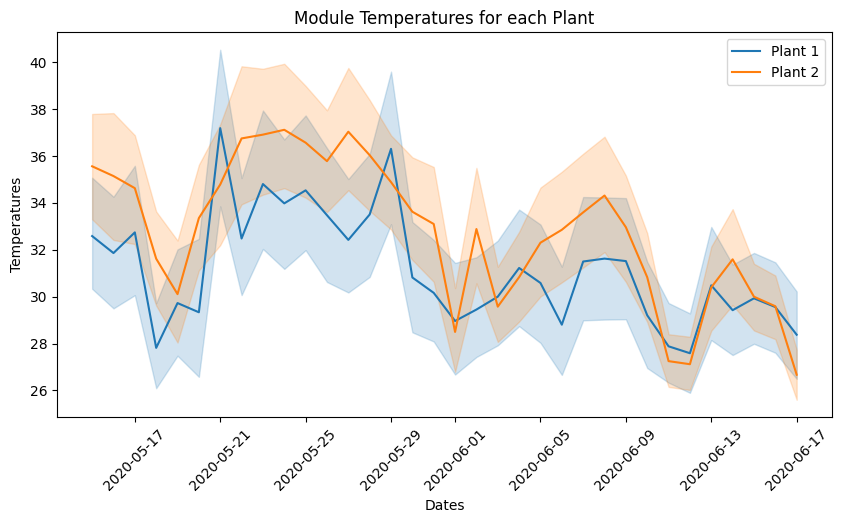

In [32]:
#Comparison of Irradiation, Ambient Temperature, and Module Tmeperature againts time in a day for each Plant

##Irradiation by dates
fig, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(data=plant1_sensor_agg, x='DATE', y='IRRADIATION', err_style='band', label='Plant 1', ax=ax)
sns.lineplot(data=plant2_sensor_agg, x='DATE', y='IRRADIATION', err_style='band', label='Plant 2', ax=ax)
plt.title('Irradiation for each Plant')
plt.xlabel('Dates')
plt.xticks(rotation=45)
plt.ylabel('Irradiation')
plt.show()

##Ambient Temperature by dates
fig, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(data=plant1_sensor_agg, x='DATE', y='AMBIENT_TEMPERATURE', err_style='band', label='Plant 1', ax=ax)
sns.lineplot(data=plant2_sensor_agg, x='DATE', y='AMBIENT_TEMPERATURE', err_style='band', label='Plant 2', ax=ax)
plt.title('Ambient Temperatures for each Plant')
plt.xlabel('Dates')
plt.xticks(rotation=45)
plt.ylabel('Temperatures')
plt.show()

##Module Temperature by dates
fig, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(data=plant1_sensor_agg, x='DATE', y='MODULE_TEMPERATURE', err_style='band', label='Plant 1', ax=ax)
sns.lineplot(data=plant2_sensor_agg, x='DATE', y='MODULE_TEMPERATURE', err_style='band', label='Plant 2', ax=ax)
plt.title('Module Temperatures for each Plant')
plt.xlabel('Dates')
plt.xticks(rotation=45)
plt.ylabel('Temperatures')
plt.show()

* Both plants exhibit similar mean solar irradiation values.
* Plant 1 generally maintains a slightly lower mean module temperature compared to Plant 2.
* The mean ambient temperature at Plant 1 is notably lower than that at Plant 2.
* Plant 1, situated in a colder region of India, is at a higher elevation compared to Plant 2, providing a plausible explanation for the similar solar irradiation levels.

# Merge Generation and Sensor Data For Each Plant

In [33]:
#Plant 1 merge data
plant1_merge = plant1_generation_agg.merge(plant1_sensor_agg, on='DATE_TIME')

#Remove the separated date and time columns
plant1_merge.drop(columns =['TIME_x', 'DATE_x', 'TIME_y', 'DATE_y'], inplace=True)

plant1_merge.head(10)

,DATE_TIME,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-06-01 00:00:00,0.0,0.0,5407.25,153519480.0,23.128673,20.464305,0.0
1,2020-06-01 00:15:00,0.0,0.0,0.00,153519480.0,23.032562,20.341429,0.0
2,2020-06-01 00:30:00,0.0,0.0,0.00,153519480.0,22.967493,20.269493,0.0
3,2020-06-01 00:45:00,0.0,0.0,0.00,153519480.0,22.810594,20.198918,0.0
4,2020-06-01 01:00:00,0.0,0.0,0.00,153519480.0,22.611436,20.085866,0.0
5,2020-06-01 01:15:00,0.0,0.0,0.00,153519480.0,22.497412,20.263627,0.0
6,2020-06-01 01:30:00,0.0,0.0,0.00,153519480.0,22.348948,20.201571,0.0
7,2020-06-01 01:45:00,0.0,0.0,0.00,153519480.0,22.151638,20.045486,0.0
8,2020-06-01 02:00:00,0.0,0.0,0.00,153519480.0,21.993119,19.941203,0.0
9,2020-06-01 02:15:00,0.0,0.0,0.00,153519480.0,21.974262,20.068544,0.0


In [34]:
#Plant 2 merge data
plant2_merge = plant2_generation_agg.merge(plant2_sensor_agg, on='DATE_TIME')

#Remove the separated date and time columns
plant2_merge.drop(columns =['TIME_x', 'DATE_x', 'TIME_y', 'DATE_y'], inplace=True)

plant2_merge.head(10)

,DATE_TIME,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15 00:00:00,0.0,0.0,48899.938095,1.418960e+10,27.004764,25.060789,0.0
1,2020-05-15 00:15:00,0.0,0.0,28401.000000,1.418960e+10,26.880811,24.421869,0.0
2,2020-05-15 00:30:00,0.0,0.0,28401.000000,1.418960e+10,26.682055,24.427290,0.0
3,2020-05-15 00:45:00,0.0,0.0,28401.000000,1.418960e+10,26.500589,24.420678,0.0
4,2020-05-15 01:00:00,0.0,0.0,26516.000000,1.418960e+10,26.596148,25.088210,0.0
5,2020-05-15 01:15:00,0.0,0.0,18976.000000,1.418960e+10,26.512740,25.317970,0.0
6,2020-05-15 01:30:00,0.0,0.0,18976.000000,1.418960e+10,26.494339,25.217193,0.0
7,2020-05-15 01:45:00,0.0,0.0,18976.000000,1.418960e+10,26.420410,25.065062,0.0
8,2020-05-15 02:00:00,0.0,0.0,18976.000000,1.418960e+10,26.401946,24.691469,0.0
9,2020-05-15 02:15:00,0.0,0.0,18976.000000,1.418960e+10,26.226078,24.559481,0.0


In building the model we wont need the DATE_TIME feature, so we will drop that

In [35]:
#Drop DATE_TIME column
plant1_merge.drop(columns='DATE_TIME', inplace=True)
plant2_merge.drop(columns='DATE_TIME', inplace=True)

In [36]:
# Re-arrange the columns (AC_POWER in last)
df_1 = plant1_merge.drop(columns='AC_POWER')
df_2 = plant1_merge['AC_POWER']
plant1_merge = pd.concat([df_1, df_2], axis='columns')

df_1 = plant2_merge.drop(columns='AC_POWER')
df_2 = plant2_merge['AC_POWER']
plant2_merge = pd.concat([df_1, df_2], axis='columns')

# Feature Selection

Let's check correlation and feature importance of features to target so that we can select relevant features in predicting AC Power

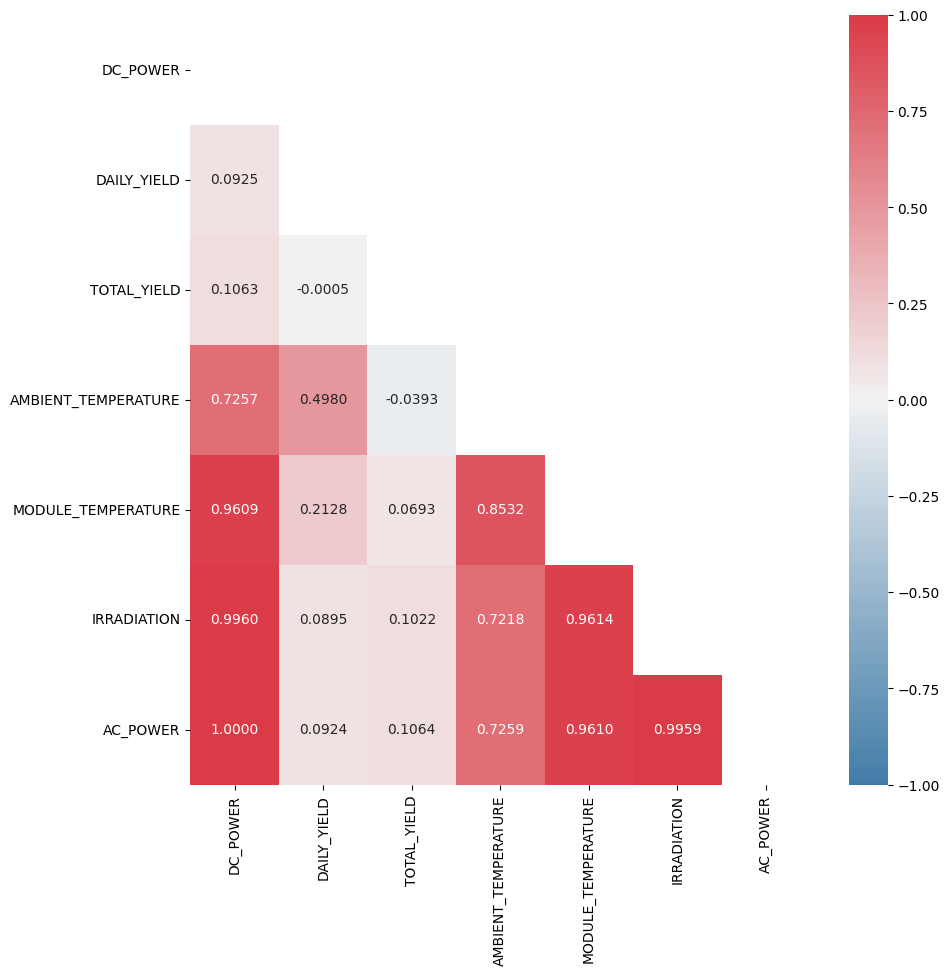

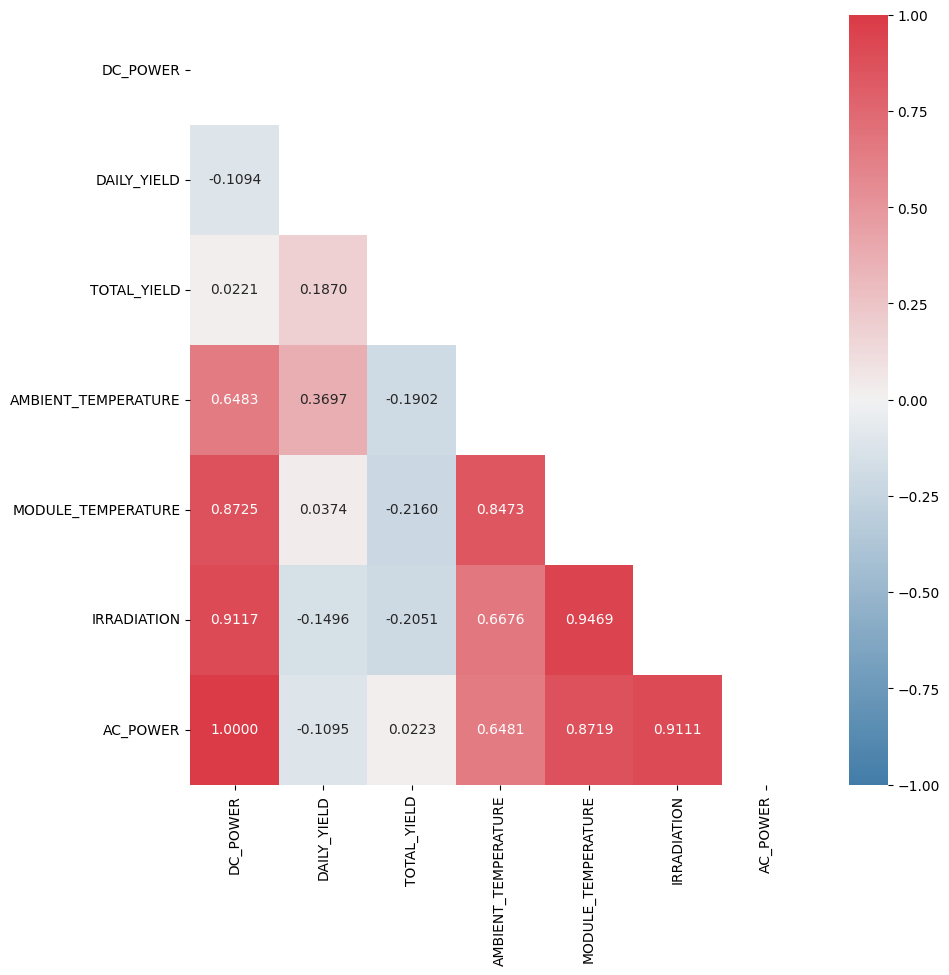

In [37]:
# Heatmap (corr pearson)

# Make new dataframe without ID column for each plant
merge1_corr = plant1_merge.corr(numeric_only=True, method='pearson')
merge2_corr = plant2_merge.corr(numeric_only=True, method='pearson')

# Plot correlation heatmap
merge1_mask = np.triu(np.ones_like(merge1_corr, dtype=bool))
merge2_mask = np.triu(np.ones_like(merge2_corr, dtype=bool))

plt.figure(figsize=(10,10))
cmap_custom = sns.diverging_palette(240, 10, as_cmap=True)
sns.heatmap(data = merge1_corr, cmap=cmap_custom, mask=merge1_mask, annot=True, fmt='.4f', vmin=-1, vmax=1)
plt.show()

plt.figure(figsize=(10,10))
cmap_custom = sns.diverging_palette(240, 10, as_cmap=True)
sns.heatmap(data = merge2_corr, cmap=cmap_custom, mask=merge2_mask, annot=True, fmt='.4f', vmin=-1, vmax=1)
plt.show()

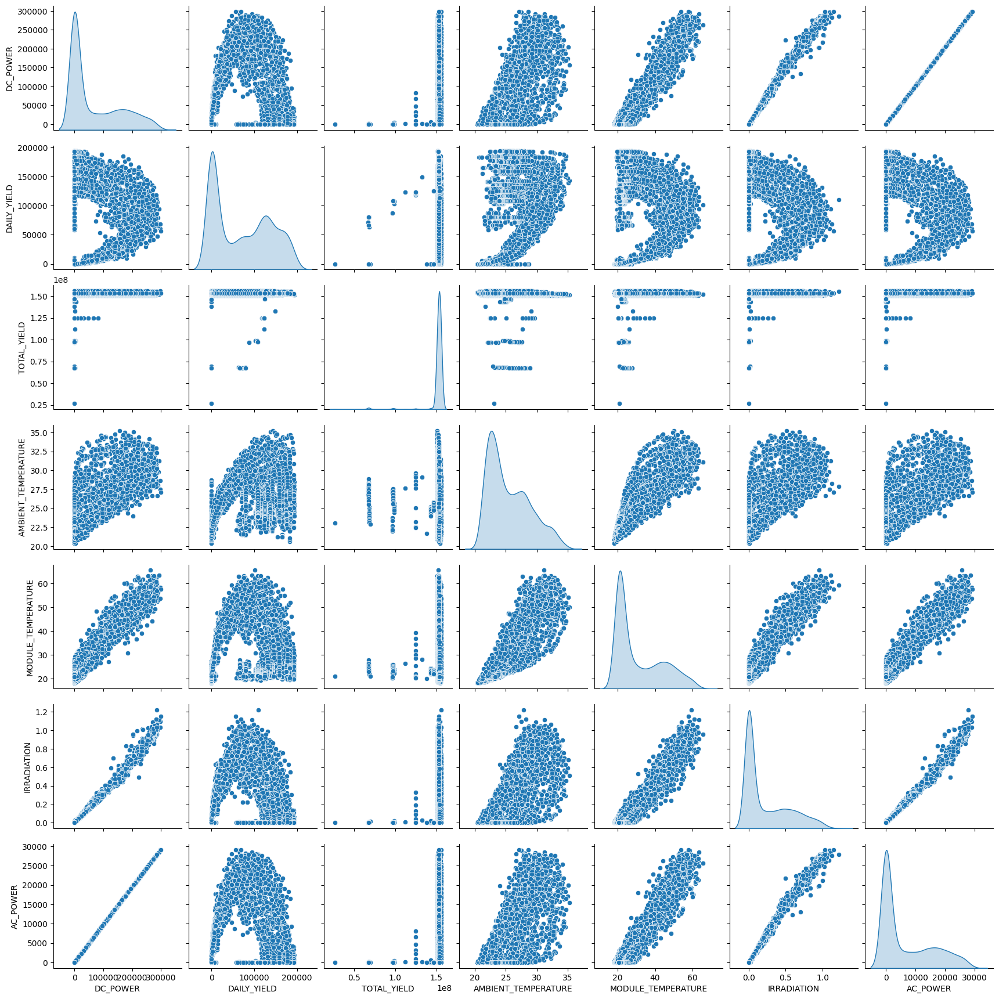

In [40]:
# Pairplot for Plant 1
sns.pairplot(data=plant1_merge, diag_kind='kde')
plt.show()

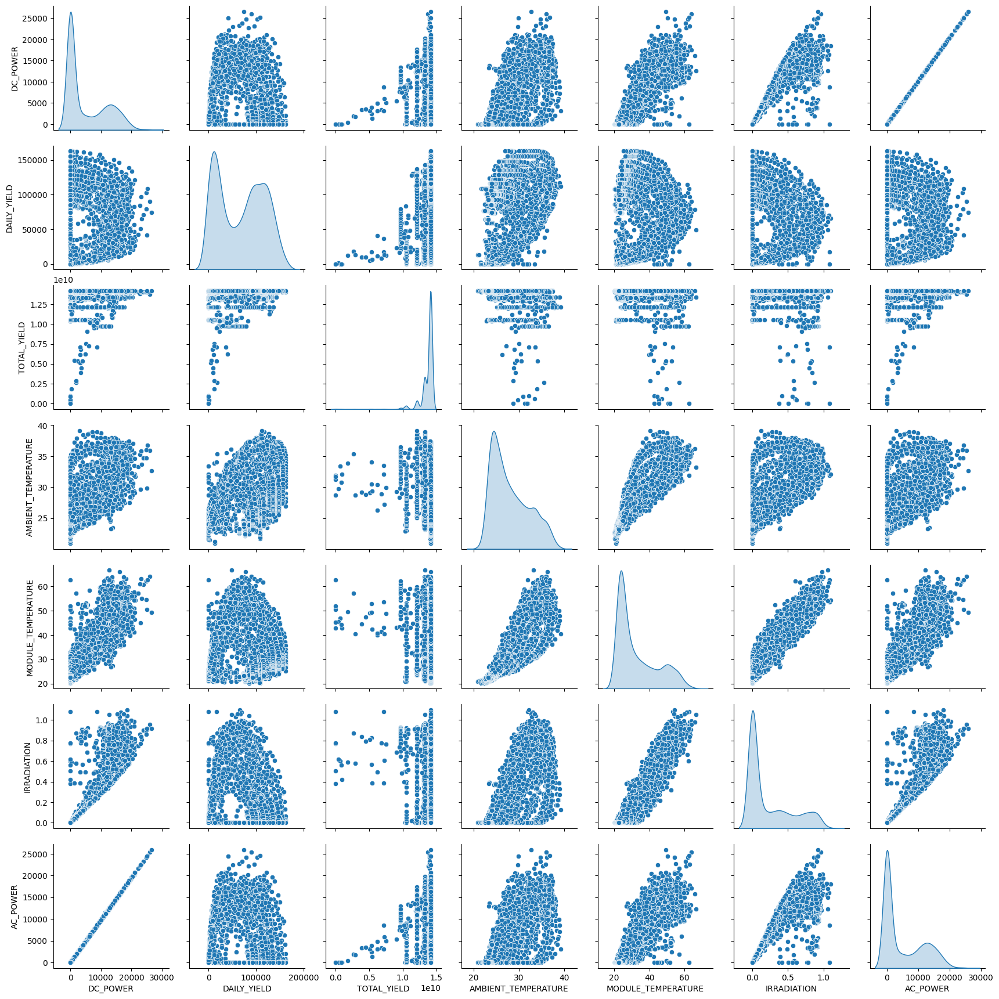

In [41]:
# Pairplot for Plant 2
sns.pairplot(data=plant2_merge, diag_kind='kde')
plt.show()

**Reminder About SelectKbest in Regression**

In scikit-learn, `f_regression` and `mutual_info_regression` are both methods for feature selection in regression problems, but they operate based on different principles.

1. **`f_regression`**:

   - **Methodology**: It uses the F-statistic to evaluate the linear dependency between each feature and the target variable. It assesses the linear relationship between each feature and the target, considering the overall variance explained by the model.

   - **Suitability**: It is appropriate when you expect linear relationships between your features and the target variable. If your features have linear correlation with the target, `f_regression` can be a suitable choice.

2. **`mutual_info_regression`**:

   - **Methodology**: It calculates the mutual information between each feature and the target. Mutual information measures the amount of information one variable contains about another. It can capture any type of statistical dependency, not limited to linear relationships.

   - **Suitability**: It is suitable when the relationship between the features and the target is not necessarily linear. If the relationship is more complex or non-linear, `mutual_info_regression` may provide better results.

**Choosing between them**:

- If you believe that the relationship between your features and the target is primarily linear, `f_regression` might be a good starting point.

- If you want to capture non-linear relationships or any form of statistical dependency, or if you are unsure about the nature of the relationships, you might consider using `mutual_info_regression`.

It's often a good practice to try both methods and compare their results or even combine them for a more comprehensive feature selection approach. Keep in mind that the effectiveness of these methods can also depend on the specific characteristics of your dataset.

In [43]:
#Calculation of feature importance score to target (numerical/categorical feature - categorical target)

from sklearn.feature_selection import SelectKBest, f_regression

# Separate features and target variable
x_features_test = plant1_merge.drop(columns=['AC_POWER'])  # Features
y_target_test = plant1_merge['AC_POWER']  # Target variable

# Instantiate SelectKBest
k_best = SelectKBest(score_func=f_regression, k='all')  # Use 'all' to see scores for all features

# Fit and transform the data
x_selected_features = k_best.fit_transform(x_features_test, y_target_test)

# Get scores and feature names
feature_scores = k_best.scores_
feature_names = x_features_test.columns

# Create a DataFrame to display feature scores
feature_scores_df = pd.DataFrame({'Feature': feature_names, 'Score': feature_scores})
feature_scores_df = feature_scores_df.sort_values(by='Score', ascending=False)

# Display the feature scores
print(feature_scores_df)

               Feature         Score
0             DC_POWER  5.623727e+08
5          IRRADIATION  3.790293e+05
4   MODULE_TEMPERATURE  3.810963e+04
3  AMBIENT_TEMPERATURE  3.513781e+03
2          TOTAL_YIELD  3.612723e+01
1          DAILY_YIELD  2.717058e+01


In [44]:
#Calculation of feature importance score to target (numerical/categorical feature - categorical target)

from sklearn.feature_selection import SelectKBest, f_regression

# Separate features and target variable
x_features_test = plant2_merge.drop(columns=['AC_POWER'])  # Features
y_target_test = plant2_merge['AC_POWER']  # Target variable

# Instantiate SelectKBest
k_best = SelectKBest(score_func=f_regression, k='all')  # Use 'all' to see scores for all features

# Fit and transform the data
x_selected_features = k_best.fit_transform(x_features_test, y_target_test)

# Get scores and feature names
feature_scores = k_best.scores_
feature_names = x_features_test.columns

# Create a DataFrame to display feature scores
feature_scores_df = pd.DataFrame({'Feature': feature_names, 'Score': feature_scores})
feature_scores_df = feature_scores_df.sort_values(by='Score', ascending=False)

# Display the feature scores
print(feature_scores_df)

               Feature         Score
0             DC_POWER  4.413434e+08
5          IRRADIATION  1.591013e+04
4   MODULE_TEMPERATURE  1.032835e+04
3  AMBIENT_TEMPERATURE  2.358703e+03
1          DAILY_YIELD  3.954912e+01
2          TOTAL_YIELD  1.626579e+00


In this case since we got obvious correlation between AC and DC power, we wont be using DC power for our prediction. Also we wont use daily and total yield because they have low correlation to target

In [45]:
# Select only relevant features

plant1_model = plant1_merge.copy()
plant2_model = plant2_merge.copy()

selected_features = ['AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE', 'IRRADIATION']

plant1_model = plant1_model[selected_features]
plant2_model = plant2_model[selected_features]

# Train-Test Split

## Train-Test Split Plant 1

In [38]:
# Spliting data into train-test
x = plant1_merge.drop(columns=['AC_POWER'])
y = plant1_merge[['AC_POWER']]

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

## Train-Test Split Plant 2

In [ ]:
# Spliting data into train-test
x = plant2_merge.drop(columns=['AC_POWER'])
y = plant2_merge[['AC_POWER']]

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# Handle Outliers

In [39]:
#Make temporary dataframe of features and target for train set
plant1_handling_outliers = pd.concat([x_train, y_train], axis='columns')
plant2_handling_outliers

In [40]:
columns_to_handle_outliers = 'AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE', 'IRRADIATION']

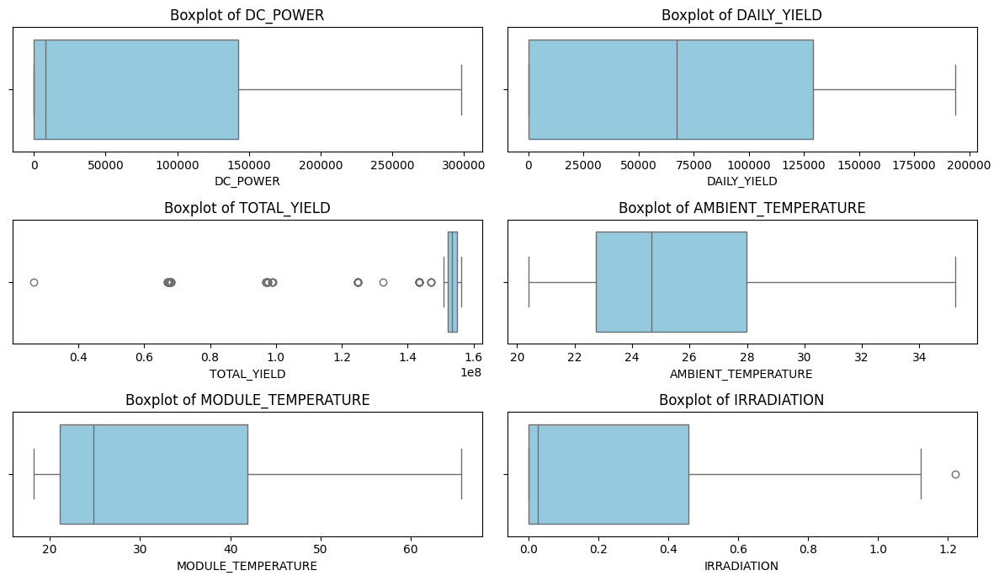

In [41]:
# Boxplot before handling outliers
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 7))
axes = axes.flatten()

for i in range(len(columns_to_handle_outliers)) :
  sns.boxplot(ax=axes[i], x=df_train_handling_outliers[columns_to_handle_outliers[i]], orient='h', color='skyblue')
  axes[i].set_title(f'Boxplot of {columns_to_handle_outliers[i]}')

for i in range(len(columns_to_handle_outliers)) :
  sns.boxplot(ax=axes[i], x=df_train_handling_outliers[columns_to_handle_outliers[i]], orient='h', color='skyblue')
  axes[i].set_title(f'Boxplot of {columns_to_handle_outliers[i]}')

# Remove the last subplot if there are fewer features than subplots
if len(columns_to_handle_outliers) < len(axes):
    axes[len(columns_to_handle_outliers)].remove()

plt.tight_layout()

In [42]:
# Remove outliers with IQR method

print(f'The number of rows before filtering out outliers : {len(df_train_handling_outliers)}')

filtered_entries = np.array([True] * len(df_train_handling_outliers))

# Select features with outliers
for col in columns_to_handle_outliers:

    Q1 = df_train_handling_outliers[col].quantile(0.25)
    Q3 = df_train_handling_outliers[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - (IQR * 1.5)
    upper_bound = Q3 + (IQR * 1.5)

    filtered_entries = ((df_train_handling_outliers[col] >= lower_bound) & (df_train_handling_outliers[col] <= upper_bound)) & filtered_entries

df_train_handling_outliers = df_train_handling_outliers[filtered_entries]

print(f'The number of rows after filtering out outliers: {len(df_train_handling_outliers)}')

The number of rows before filtering out outliers : 2209
The number of rows after filtering out outliers: 2147


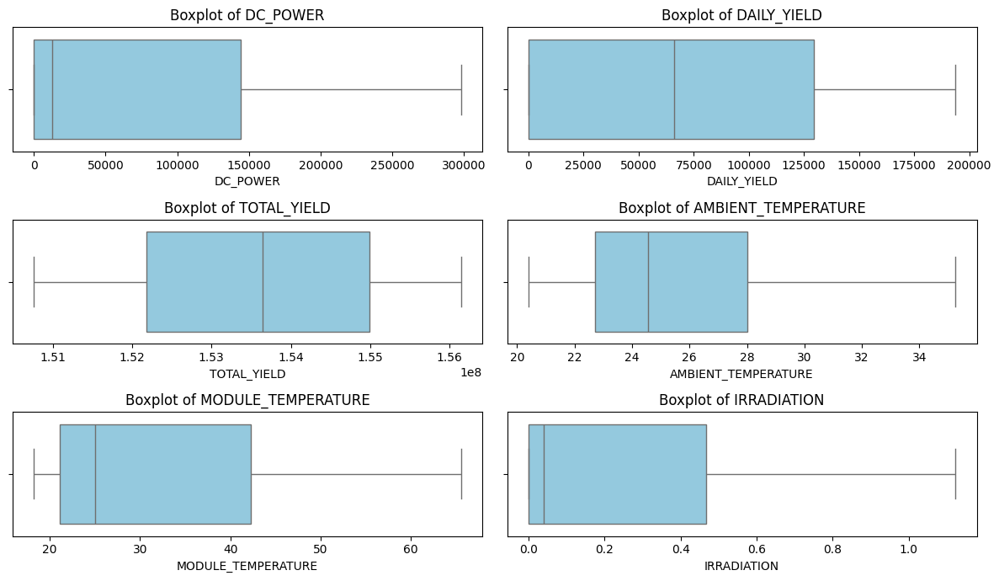

In [43]:
# Boxplot before handling outliers
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(12, 7))
axes = axes.flatten()

for i in range(len(columns_to_handle_outliers)) :
  sns.boxplot(ax=axes[i], x=df_train_handling_outliers[columns_to_handle_outliers[i]], orient='h', color='skyblue')
  axes[i].set_title(f'Boxplot of {columns_to_handle_outliers[i]}')


# Remove the last subplot if there are fewer features than subplots
if len(columns_to_handle_outliers) < len(axes):
    axes[len(columns_to_handle_outliers)].remove()

plt.tight_layout()

In [44]:
#Split the features and target for train set again
x_train = df_train_handling_outliers.drop(columns='AC_POWER')
y_train = df_train_handling_outliers['AC_POWER']

# Feature Scaling

Scaling will be done to train and test data

In [45]:
x_train

,DC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
748,0.000000,182943.000000,1.548188e+08,25.647653,23.230061,0.000000
2581,95108.875000,187745.250000,1.525442e+08,34.310097,46.149711,0.306096
662,0.000000,168197.000000,1.546358e+08,23.465310,21.887561,0.000000
480,0.000000,0.000000,1.543278e+08,22.446710,19.740186,0.000000
803,189591.571430,23259.553570,1.548420e+08,26.633242,45.439112,0.650318
...,...,...,...,...,...,...
3092,49989.714286,4279.767857,1.533925e+08,23.244623,26.083354,0.152250
1095,127271.839286,23150.982142,1.552841e+08,24.942493,36.774971,0.390469
1130,0.000000,127815.000000,1.553888e+08,25.324770,24.317898,0.000143
1294,126677.285715,69845.928570,1.556439e+08,25.923041,38.486489,0.426235


In [46]:
x_test

,DC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
3052,0.000000,159056.000000,1.533883e+08,23.331049,21.166125,0.000000
2971,0.000000,0.000000,1.532292e+08,21.305418,20.401349,0.000000
2960,0.000000,80126.000000,1.532292e+08,21.807628,20.890235,0.000000
2334,0.000000,0.000000,1.519947e+08,21.620870,20.551786,0.000000
139,203475.160714,54073.571429,1.537010e+08,27.363865,43.500977,0.643870
...,...,...,...,...,...,...
1618,0.000000,142114.000000,1.510412e+08,24.378021,22.112622,0.000000
1173,0.000000,0.000000,1.553888e+08,21.506586,19.002364,0.000000
340,273825.749990,107259.428571,1.540877e+08,30.470314,57.810960,1.039666
1330,0.000000,155054.000000,1.557291e+08,23.836828,22.606569,0.000000


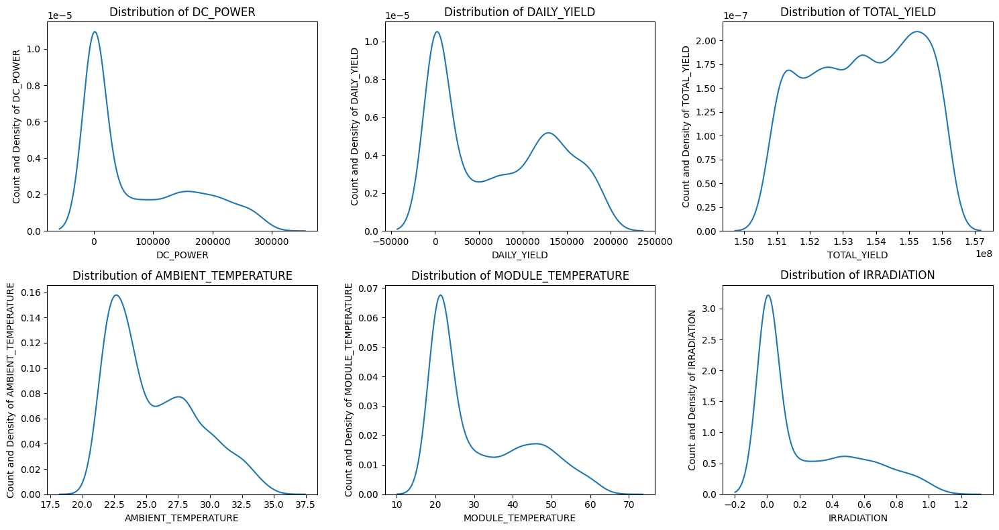

In [50]:
# Checking distribution before scaling
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15,8))
axes = axes.flatten()

for i in range(len(x_train.columns)) :
    sns.kdeplot(ax=axes[i], x=x_train[x_train.columns[i]])
    axes[i].set_title(f'Distribution of {x_train.columns[i]}')
    axes[i].set_ylabel(f'Count and Density of {x_train.columns[i]}')
    axes[i].set_xlabel(f'{x_train.columns[i]}')

# Remove the last subplot if there are fewer features than subplots
if len(x_train.columns) < len(axes) :
    axes[len(x_train.columns)].remove()

plt.tight_layout()

In [ ]:
# #Normalization (MinMaxScaller)
# from sklearn.preprocessing import MinMaxScaler
# ms = MinMaxScaler()

# columns_to_scale = ['Income', 'Age', 'Experience', 'Income_Age_Ratio', 'Profession', 'City', 'State'] #pilih kolom tertentu untuk dilakukan scaling (sesuai keterangan mentor)
# # columns_to_scale = x_train.columns.to_list() #pilih semua kolom

# scale_features = x_train[columns_to_scale]
# for n in scale_features:
#   x_train[n] = ms.fit_transform(x_train[[n]])
#   x_test[n] = ms.fit_transform(x_test[[n]])
#   # scaler.to_pickle(filename)

In [54]:
#Standardization (Z-score normalization)
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()

columns_to_scale = ['DC_POWER', 'DAILY_YIELD', 'TOTAL_YIELD', 'AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE', 'IRRADIATION']

scale_features = x_train[columns_to_scale]
for n in scale_features:
  x_train[n] = ss.fit_transform(x_train[[n]])
  x_test[n] = ss.fit_transform(x_test[[n]])
  # scaler.to_pickle(filename)

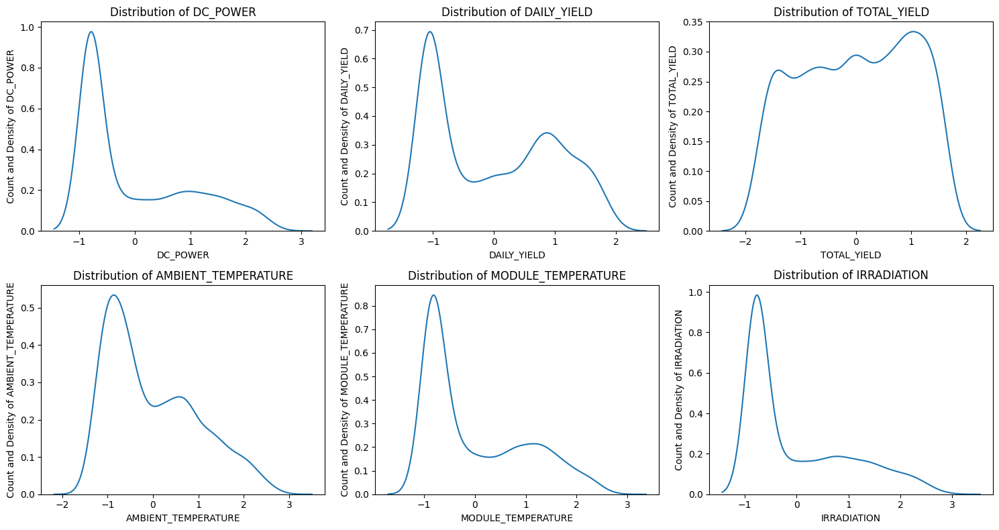

In [55]:
# Checking distribution after scaling
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15,8))
axes = axes.flatten()

for i in range(len(x_train.columns)) :
    sns.kdeplot(ax=axes[i], x=x_train[x_train.columns[i]])
    axes[i].set_title(f'Distribution of {x_train.columns[i]}')
    axes[i].set_ylabel(f'Count and Density of {x_train.columns[i]}')
    axes[i].set_xlabel(f'{x_train.columns[i]}')

# Remove the last subplot if there are fewer features than subplots
if len(x_train.columns) < len(axes) :
    axes[len(x_train.columns)].remove()

plt.tight_layout()

In [56]:
# Linear Regression
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(x_train, y_train)

LinearRegression()

In [57]:
# Ridge Regression
from sklearn.linear_model import Ridge
ridge = Ridge()
ridge.fit(x_train, y_train)

Ridge()

In [58]:
# Lasso Regression
from sklearn.linear_model import Lasso
lasso = Lasso()
lasso.fit(x_train, y_train)

Lasso()

In [59]:
# Elastic Net Regression
from sklearn.linear_model import ElasticNet
elasticnet = ElasticNet()
elasticnet.fit(x_train, y_train)

ElasticNet()

In [60]:
# Decision Tree
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor()
dt.fit(x_train, y_train)

DecisionTreeRegressor()

In [61]:
# Random Forest
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(x_train, y_train)

RandomForestRegressor()

In [62]:
# Support Vector Regression
from sklearn.svm import SVR
svr = SVR()
svr.fit(x_train, y_train)

SVR()

In [63]:
# Boosting : AdaBoost Regression
from sklearn.ensemble import AdaBoostRegressor
ab = AdaBoostRegressor()
ab.fit(x_train, y_train)

AdaBoostRegressor()

In [64]:
# Boosting : XGBoost Regression
from xgboost import XGBRegressor
xg = XGBRegressor()
xg.fit(x_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [65]:
#Import metrics score that will be evalueated
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.model_selection import cross_validate

#Function for model evaluation metrics score
def eval_regression(model):
  y_pred = model.predict(x_test)
  y_pred_train = model.predict(x_train)

  # print('MAE (train): ' + str(mean_absolute_error(y_test, y_pred_train)))
  print('MAE (test): ' + str(mean_absolute_error(y_test, y_pred)))

  # print('RMSE (train): ' + str(mean_squared_error(y_train, y_pred_train, squared=False)))
  print('RMSE (test): ' + str(mean_squared_error(y_test, y_pred, squared=False)))

  # print('MAPE (train): ' + str(mean_absolute_percentage_error(y_train, y_pred_train)))
  print('MAPE (test): ' + str(mean_absolute_percentage_error(y_test, y_pred)))

  # print('R2 (train): ' + str(r2_score(y_train, y_pred_train)))
  print('R2 (test): ' + str(r2_score(y_test, y_pred)))

  #Cross Validation
  score = cross_validate(model, x_train, y_train, cv=5, scoring='r2', return_train_score=True) #scoring change based on what metrics we want to validate (usually choose the main performance metric)
  print('R2 Score (crossval train): '+ str(score['train_score'].mean()))
  print('R2 Score (crossval test): '+ str(score['test_score'].mean()))


In [66]:
#Printing metrics score for all models to compare

#Linear Regression
print('\nEvaluate LinearRegression')
eval_regression(lr)

#Ridge Regressor
print('\nEvaluate RidgeRegression')
eval_regression(ridge)

#Lasso Regressor
print('\nEvaluate LassoRegression')
eval_regression(lasso)

#Elastic Net Regressor
print('\nEvaluate ElasticNetRegression')
eval_regression(elasticnet)

#Decision Tree Regressor
print('\nEvaluate DecisionTreeRegressor')
eval_regression(dt)

#Random Forest Regressor
print('\nEvaluate RandomForestRegressor')
eval_regression(rf)

#Support Vector Regressor
print('\nEvaluate SVR')
eval_regression(svr)

#AdaBoost Regressor
print('\nEvaluate AdaBoostRegressor')
eval_regression(ab)

#XGBoost Regressor
print('\nEvaluate XGBRegressor')
eval_regression(xg)


Evaluate LinearRegression
MAE (test): 484.4723648595306
RMSE (test): 562.8350003965936
MAPE (test): 5.469007459968711e+17
R2 (test): 0.9955416696741947
R2 Score (crossval train): 0.9999955964009516
R2 Score (crossval test): 0.9999955374706566

Evaluate RidgeRegression
MAE (test): 484.4723648595304
RMSE (test): 562.7239005120658
MAPE (test): 5.590045177459459e+17
R2 (test): 0.9955434295899697
R2 Score (crossval train): 0.9999607802508615
R2 Score (crossval test): 0.999959765012826

Evaluate LassoRegression
MAE (test): 484.4723648595305
RMSE (test): 562.5144035064096
MAPE (test): 5.519916835205559e+17
R2 (test): 0.9955467472537939
R2 Score (crossval train): 0.9999942864243817
R2 Score (crossval test): 0.9999942260075215

Evaluate ElasticNetRegression
MAE (test): 1213.5063757034936
RMSE (test): 1469.866832312761
MAPE (test): 2.2188971227453071e+18
R2 (test): 0.9695935281910257
R2 Score (crossval train): 0.967774939066507
R2 Score (crossval test): 0.9674919797108545

Evaluate DecisionTree

# Univariate Analysis

## Numerical Columns

In [19]:
#Check number of subplots that will be make
len(df[nums].columns)

9

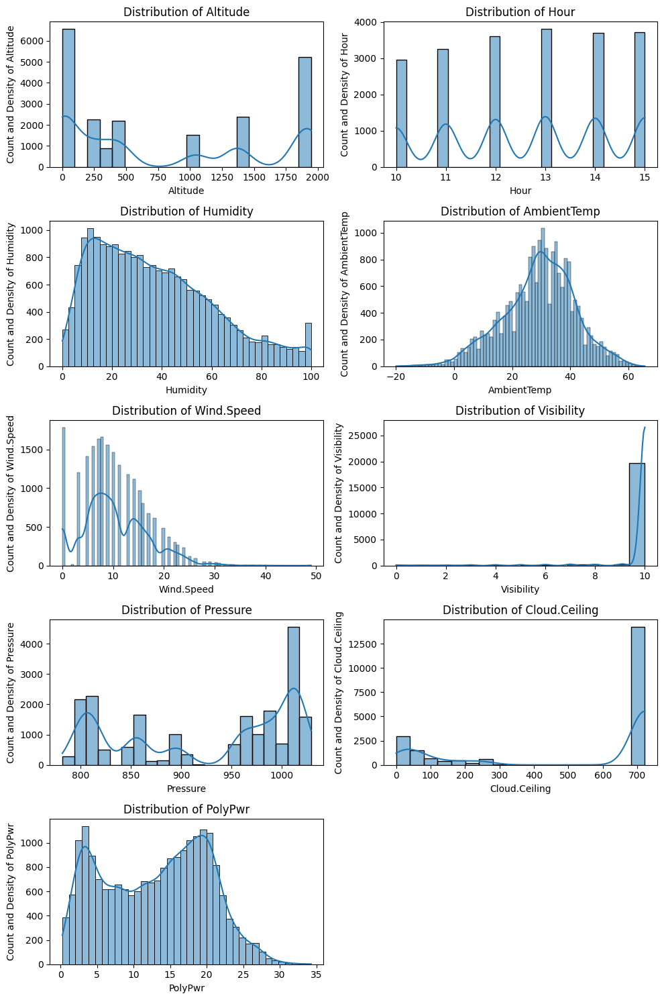

In [20]:
# Histplot with kde

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10,15))
axes = axes.flatten()

for i in range(len(nums)) :
    sns.histplot(ax=axes[i], x=df[nums[i]], kde=True)
    axes[i].set_title(f'Distribution of {nums[i]}')
    axes[i].set_ylabel(f'Count and Density of {nums[i]}')
    axes[i].set_xlabel(f'{nums[i]}')

# Remove the last subplot if there are fewer features than subplots
if len(nums) < len(axes) :
    axes[len(nums)].remove()

    plt.tight_layout()

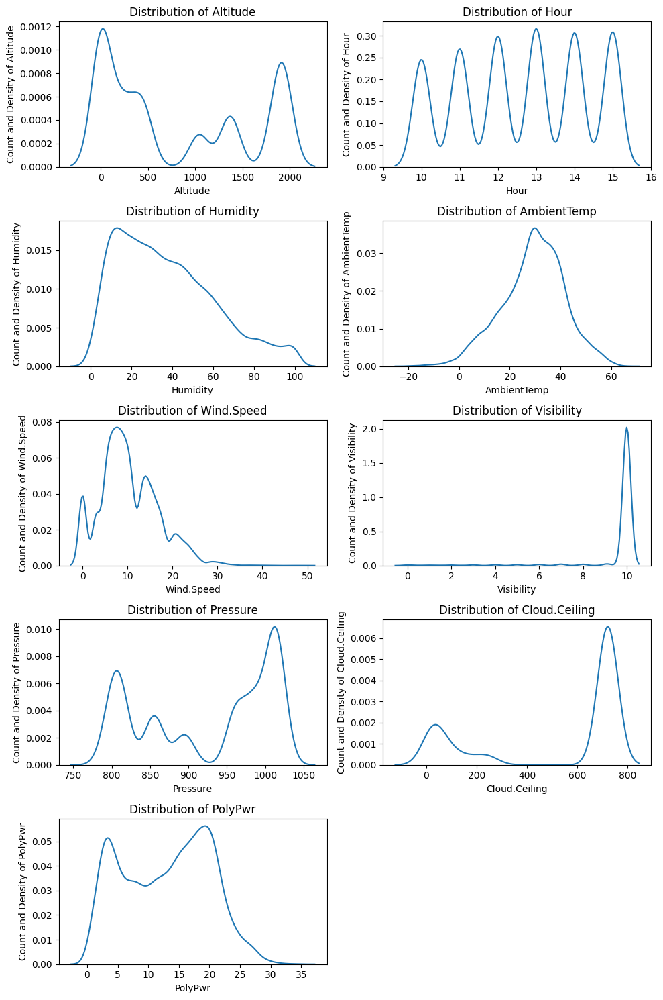

In [21]:
# Focusing only on kde

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10,15))
axes = axes.flatten()

for i in range(len(nums)) :
    sns.kdeplot(ax=axes[i], x=df[nums[i]])
    axes[i].set_title(f'Distribution of {nums[i]}')
    axes[i].set_ylabel(f'Count and Density of {nums[i]}')
    axes[i].set_xlabel(f'{nums[i]}')

# Remove the last subplot if there are fewer features than subplots
if len(nums) < len(axes) :
    axes[len(nums)].remove()

    plt.tight_layout()

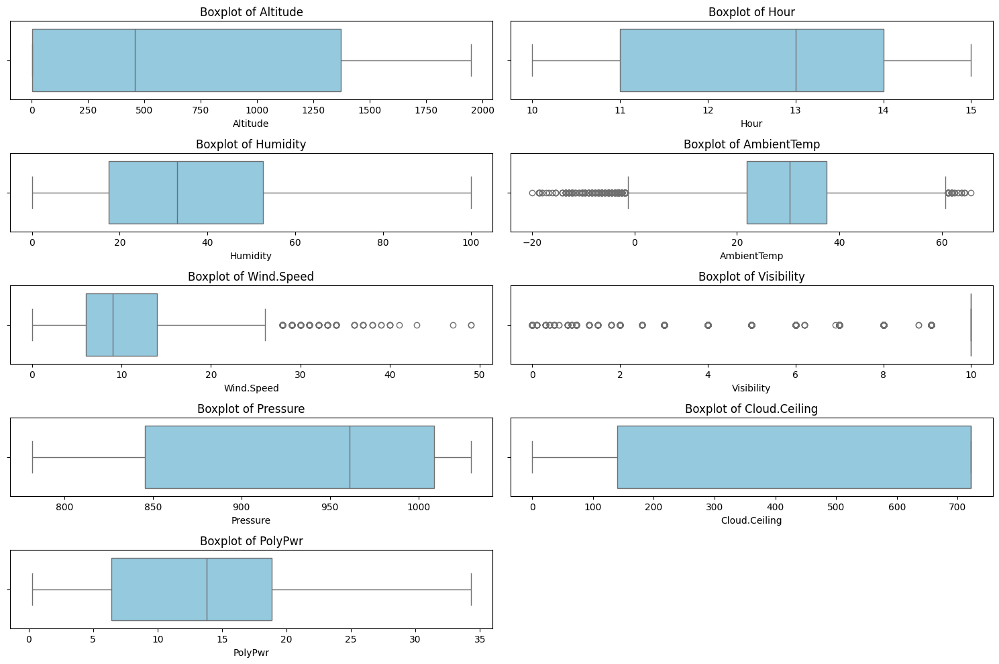

In [22]:
# Boxplot
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 10))
axes = axes.flatten()

for i in range(len(nums)) :
  sns.boxplot(ax=axes[i], x=df[nums[i]], orient='h', color='skyblue')
  axes[i].set_title(f'Boxplot of {nums[i]}')

# Remove the last subplot if there are fewer features than subplots
if len(nums) < len(axes):
    axes[len(nums)].remove()

plt.tight_layout()

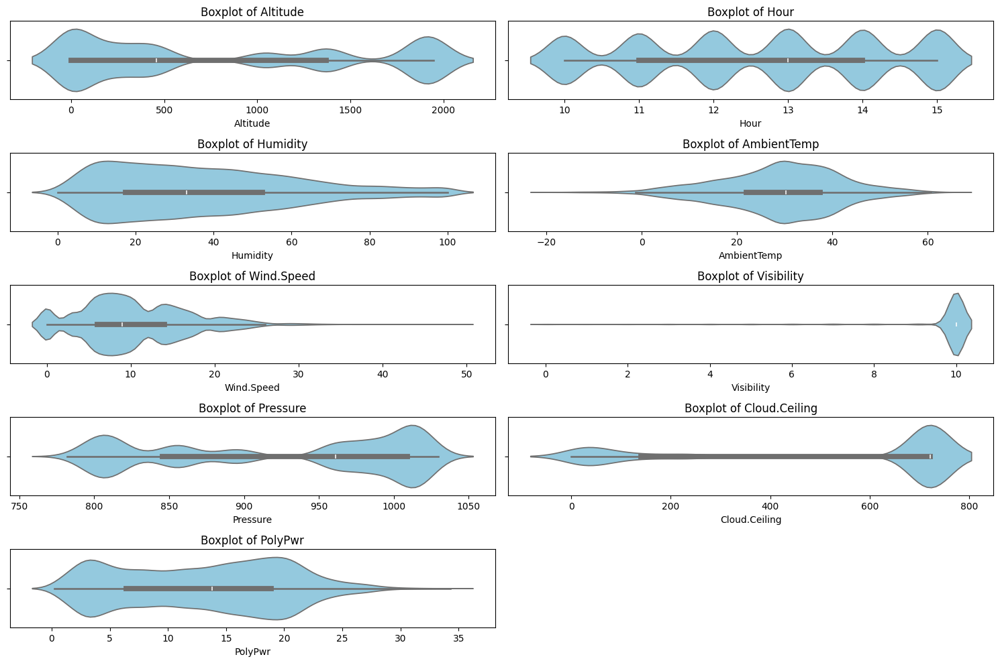

In [23]:
# Violinplot
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 10))
axes = axes.flatten()

for i in range(len(nums)) :
  sns.violinplot(ax=axes[i], x=df[nums[i]], orient='h', color='skyblue')
  axes[i].set_title(f'Boxplot of {nums[i]}')

# Remove the last subplot if there are fewer features than subplots
if len(nums) < len(axes):
    axes[len(nums)].remove()

plt.tight_layout()

There are not many features with outliers, only AmbientTemp, Wind.Speed, and Visibility

## Categorical Columns

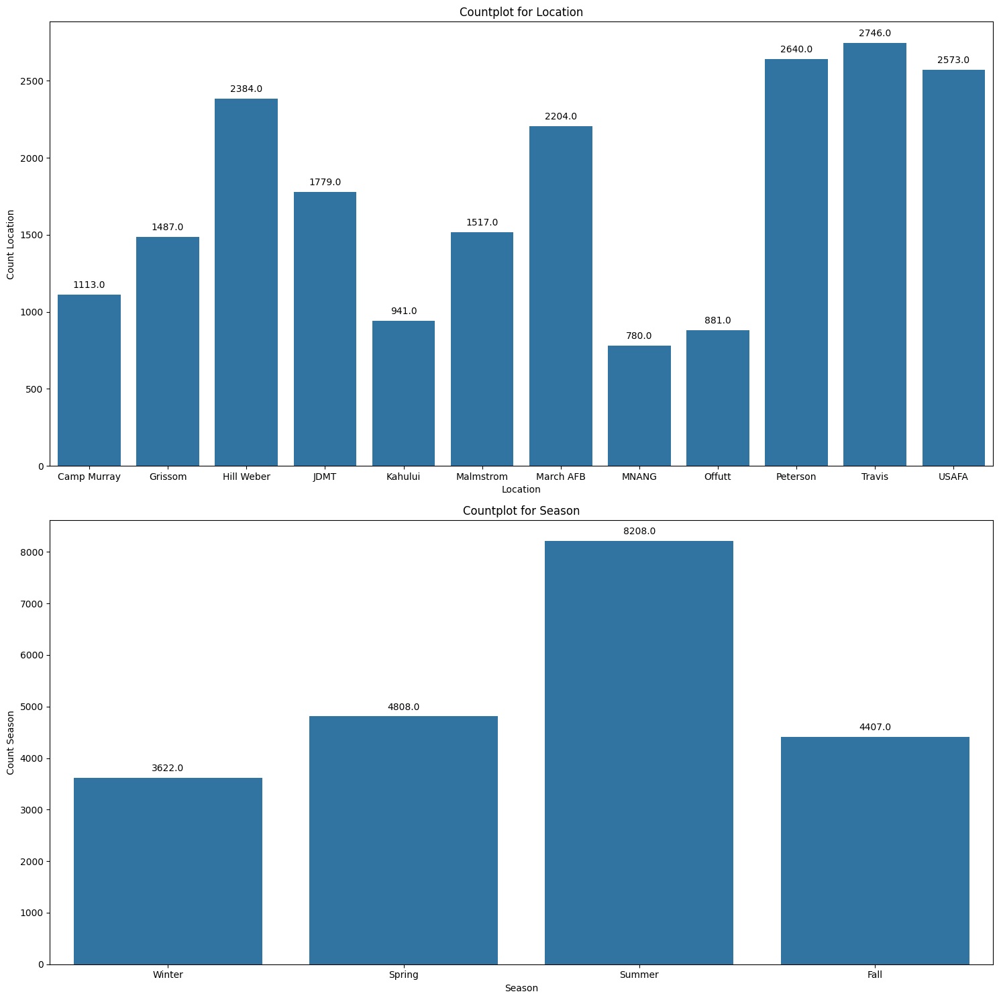

In [24]:
#Countplot
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(15, 15))

for i in range(len(cats)):
    ax = sns.countplot(ax=axes[i], x=df[cats[i]])
    axes[i].set_title(f'Countplot for {cats[i]}')
    axes[i].set_ylabel(f'Count {cats[i]}')
    axes[i].tick_params(axis='x')

    # Adding annotations on top of each bar
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.tight_layout()
plt.show()


# Bivariate/Multivariate Analysis

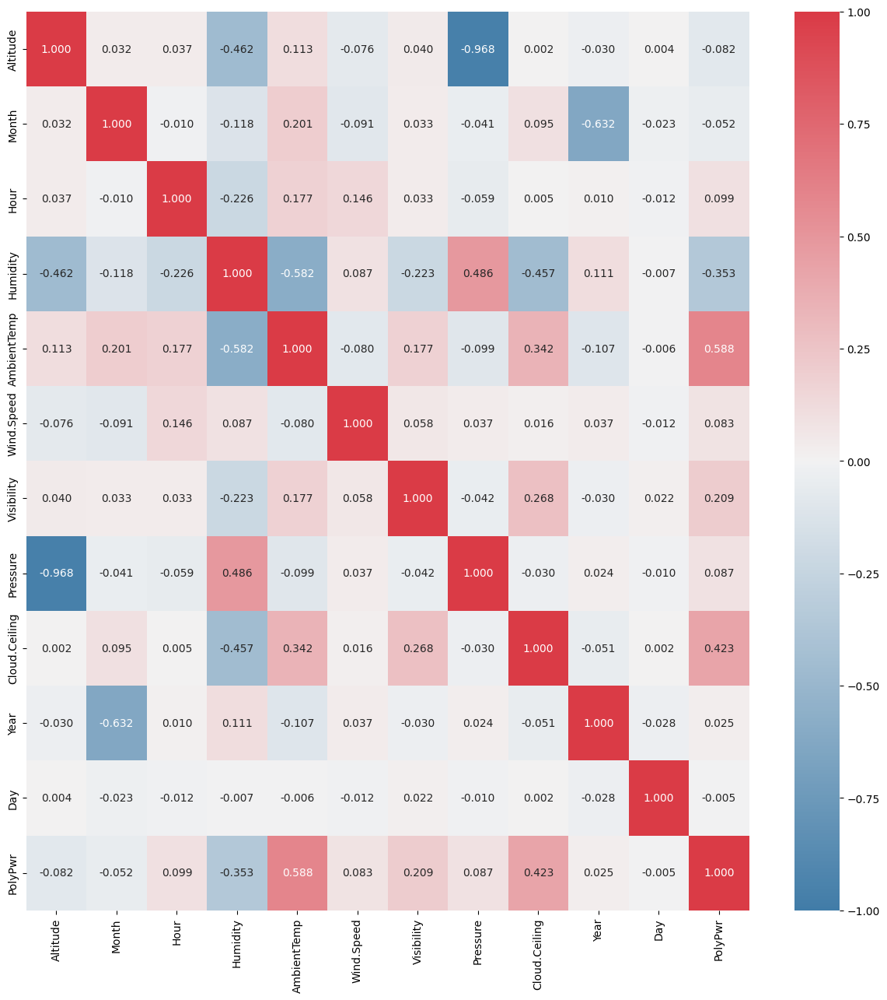

In [25]:
# Heatmap (corr spearman)
plt.figure(figsize=(15,15))
cmap_custom = sns.diverging_palette(240, 10, as_cmap=True)
sns.heatmap(data = df.corr(numeric_only=True, method='spearman'), cmap=cmap_custom, annot=True, fmt='.3f', vmin=-1, vmax=1)
plt.show()

In this case we use spearman correlation that is more robust/accurate in capturing non-linear (can be seen from pairplot down below) correlation of features. Some feature that have high correlation to target are Humidity, AmbientTemp, Visibility, and Cloud.Ceiling. We also likely to drop or not use Altitude feature since it has really high correlation to Pressure to avoid multicollinearity.

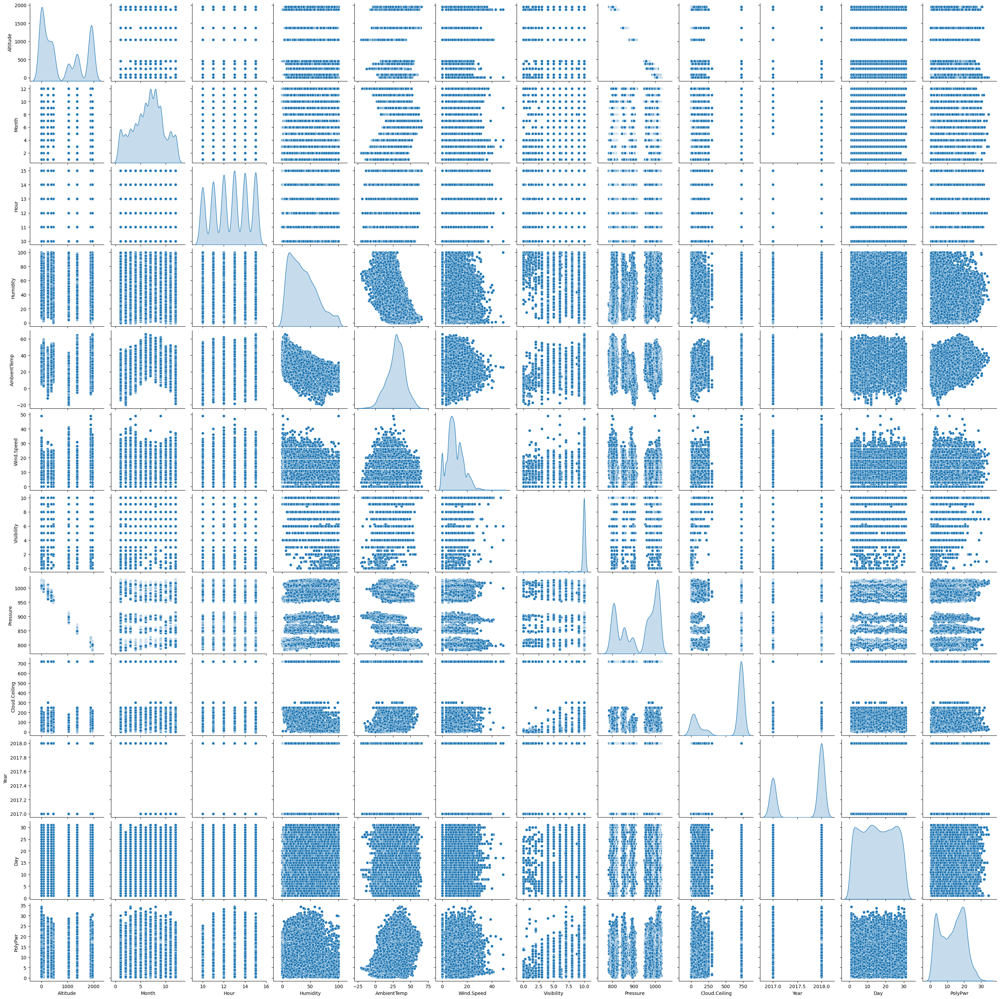

In [26]:
# Pairplot
sns.pairplot(df, diag_kind='kde')
plt.show()

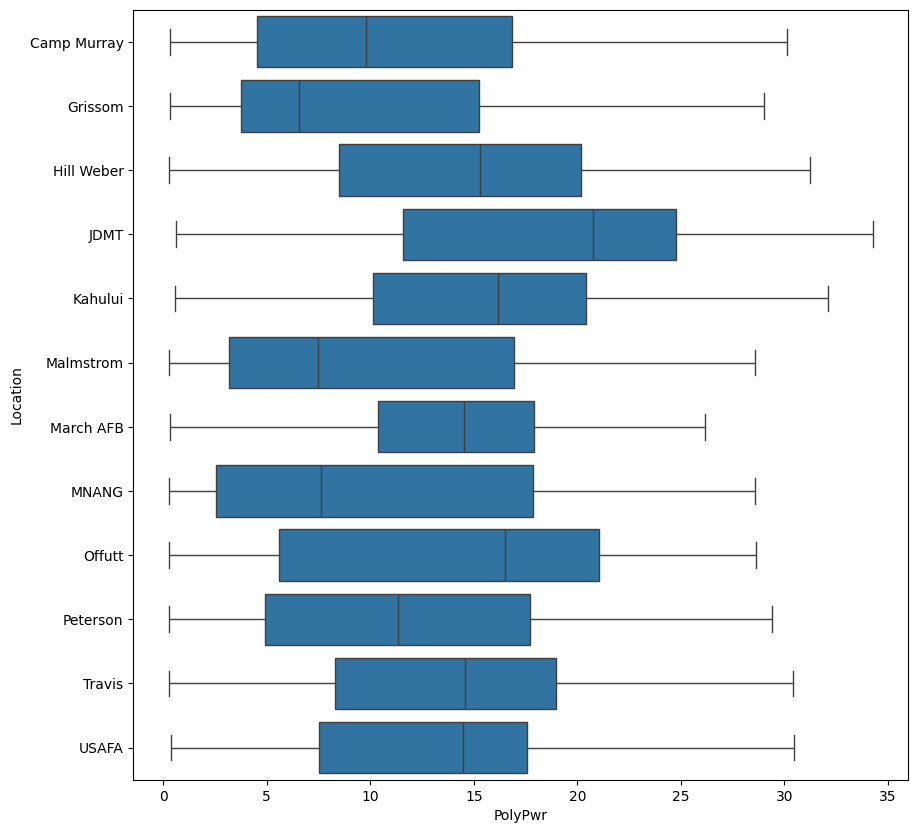

In [27]:
#Boxplot of PolyPwr by Location
plt.figure(figsize=(10,10))
sns.boxplot(data=df, x='PolyPwr', y='Location')
plt.show()

In [28]:
#Mean PolyPwr by Season
df_mean_power_season = df.groupby('Season').agg({'PolyPwr' : ['mean']})
df_mean_power_season

,PolyPwr
,mean
Season,
Fall,11.167499
Spring,14.192405
Summer,15.320546
Winter,8.263660


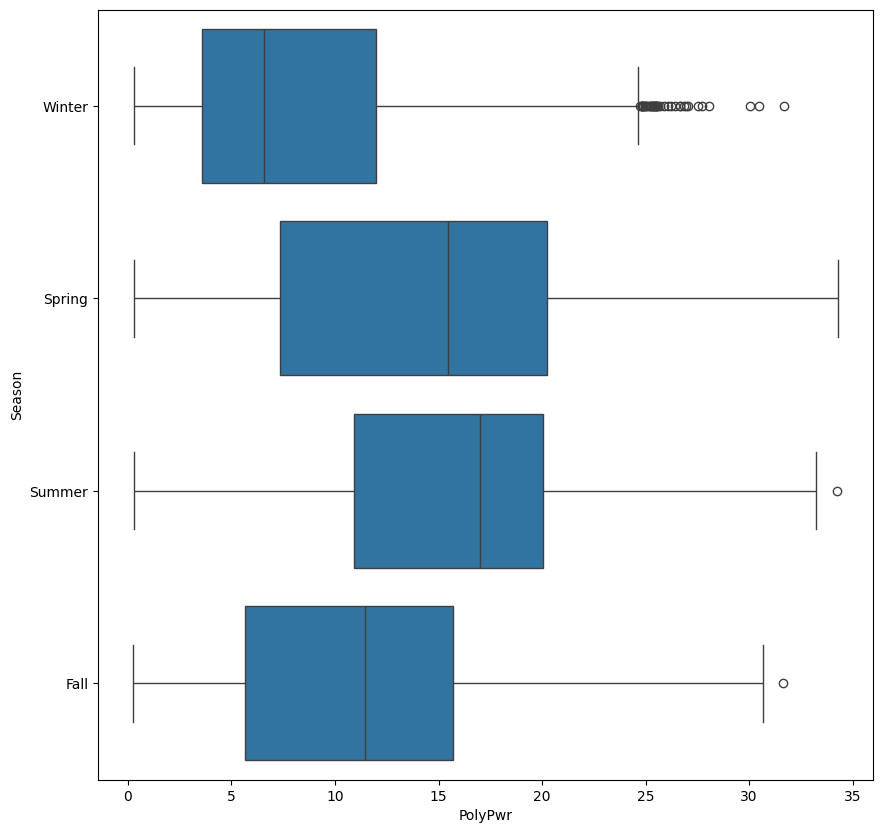

In [29]:
#Boxplot of PolyPwr by Season
plt.figure(figsize=(10,10))
sns.boxplot(data=df, x='PolyPwr', y='Season')
plt.show()

Summer as expected have the highest median PolyPwr with the lowest variability and highest overall mean of PolyPwr from all season

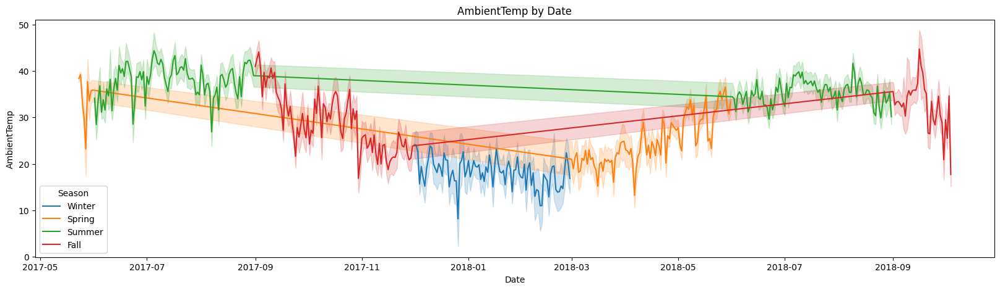

In [30]:
#AmbientTemp by Date per Season
plt.figure(figsize=(20,5))
sns.lineplot(data=df, x='Date', y='AmbientTemp', hue='Season')
plt.ylabel('AmbientTemp')
plt.xlabel('Date')
plt.title('AmbientTemp by Date')
plt.show()

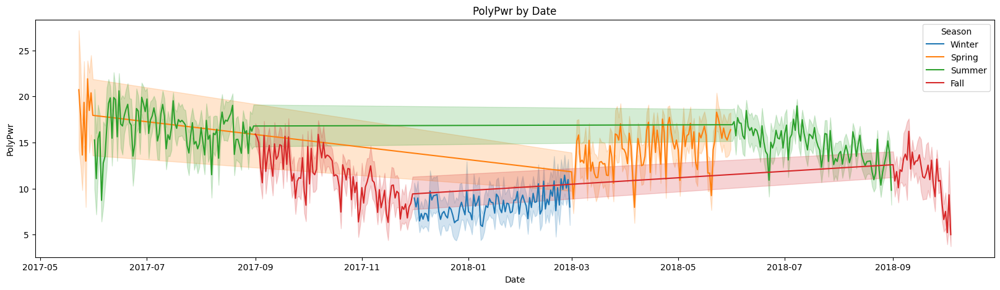

In [31]:
#Polypwr by Date per Season
plt.figure(figsize=(20,5))
sns.lineplot(data=df, x='Date', y='PolyPwr', hue='Season')
plt.ylabel('PolyPwr')
plt.xlabel('Date')
plt.title('PolyPwr by Date')
plt.show()

The ambient temperature does have the same trend with PolyPwr generated where it went down during Winter

At first, I wanted to create a PolyPwr plot by hour because from my experience learning about solar cell irradiation, there is something called peak hours. These are periods during the day when solar radiation reaches its highest intensity, and solar cells receive sunlight with maximum intensity, resulting in optimal electricity production. However, I just realized that the 'Hour' feature in this dataset only represents the peak hours, not all hours in a day. Additionally, the distribution, as seen in the pair plot, does not allow for depicting a curve that typically has a peak shape during peak hours.

# Pre-Processing & Feature Engineering

In [32]:
# Make a copy of original dataframe for preprocessing and encoding process

df_encoding = df.copy()

df_encoding.sample(5)

,Location,Date,Altitude,Month,Hour,Season,Humidity,AmbientTemp,Wind.Speed,Visibility,Pressure,Cloud.Ceiling,Year,Day,PolyPwr
782,Camp Murray,2018-08-01,84,8,12,Summer,26.46484,36.72943,8,10.0,1006.2,722,2018,1,21.97565
432,Camp Murray,2018-05-31,84,5,11,Spring,47.67456,19.45045,0,10.0,1002.2,23,2018,31,5.41863
16416,Travis,2017-10-06,1,10,11,Fall,20.56274,26.51764,9,10.0,1015.0,722,2017,6,13.81502
5974,JDMT,2017-12-14,2,12,12,Winter,23.32153,34.83360,3,10.0,1019.3,722,2017,14,23.14506
9367,March AFB,2017-07-31,458,7,13,Summer,28.80249,38.13934,7,10.0,959.2,722,2017,31,20.20419


In [33]:
# Drop features that are irrelevant and we will not use for this modelling case

df_encoding = df_encoding.drop(columns=['Date', 'Altitude', 'Year'])

In [34]:
# One-hot encoding for Location

onehots = pd.get_dummies(df_encoding['Location'], prefix='Location')
onehots = onehots.astype(int)
df_encoding = df_encoding.join(onehots)

#Drop the Location after one-hot encoding
df_encoding.drop(columns='Location', inplace=True)

In [35]:
# One-hot encoding for Season

onehots = pd.get_dummies(df_encoding['Season'], prefix='Season')
onehots = onehots.astype(int)
df_encoding = df_encoding.join(onehots)

#Drop the Location after one-hot encoding
df_encoding.drop(columns='Season', inplace=True)

In [36]:
#Check dataframe after encoding and drop irrelevant features
df_encoding

,Month,Hour,Humidity,AmbientTemp,Wind.Speed,Visibility,Pressure,Cloud.Ceiling,Day,PolyPwr,Location_Camp Murray,Location_Grissom,Location_Hill Weber,Location_JDMT,Location_Kahului,Location_MNANG,Location_Malmstrom,Location_March AFB,Location_Offutt,Location_Peterson,Location_Travis,Location_USAFA,Season_Fall,Season_Spring,Season_Summer,Season_Winter
0,12,11,81.71997,12.86919,5,10.0,1010.6,722,3,2.42769,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,12,13,96.64917,9.66415,0,10.0,1011.3,23,3,2.46273,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,12,13,93.61572,15.44983,5,10.0,1011.6,32,3,4.46836,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,12,12,77.21558,10.36659,5,2.0,1024.4,6,4,1.65364,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,12,14,54.80347,16.85471,3,3.0,1023.7,9,4,6.57939,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21040,9,15,11.66992,43.22510,14,10.0,802.3,722,28,9.79611,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
21041,9,13,18.22510,28.98247,13,10.0,799.2,722,29,10.88992,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
21042,9,14,15.52124,33.49167,10,10.0,798.4,722,29,8.24479,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
21043,9,15,6.63452,51.62163,10,10.0,797.8,722,29,12.47328,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0


In [37]:
# Re-arrange the columns (PolyPwr in last)
df_1 = df_encoding.drop(columns='PolyPwr')
df_2 = df_encoding['PolyPwr']
df_encoding = pd.concat([df_1, df_2], axis='columns')

# Feature Selection

At first we will just use all the features that we got after pre-processing, this part is just additional check to compare the result of df.corr() with SelectKbest to see what will best features for prediction later

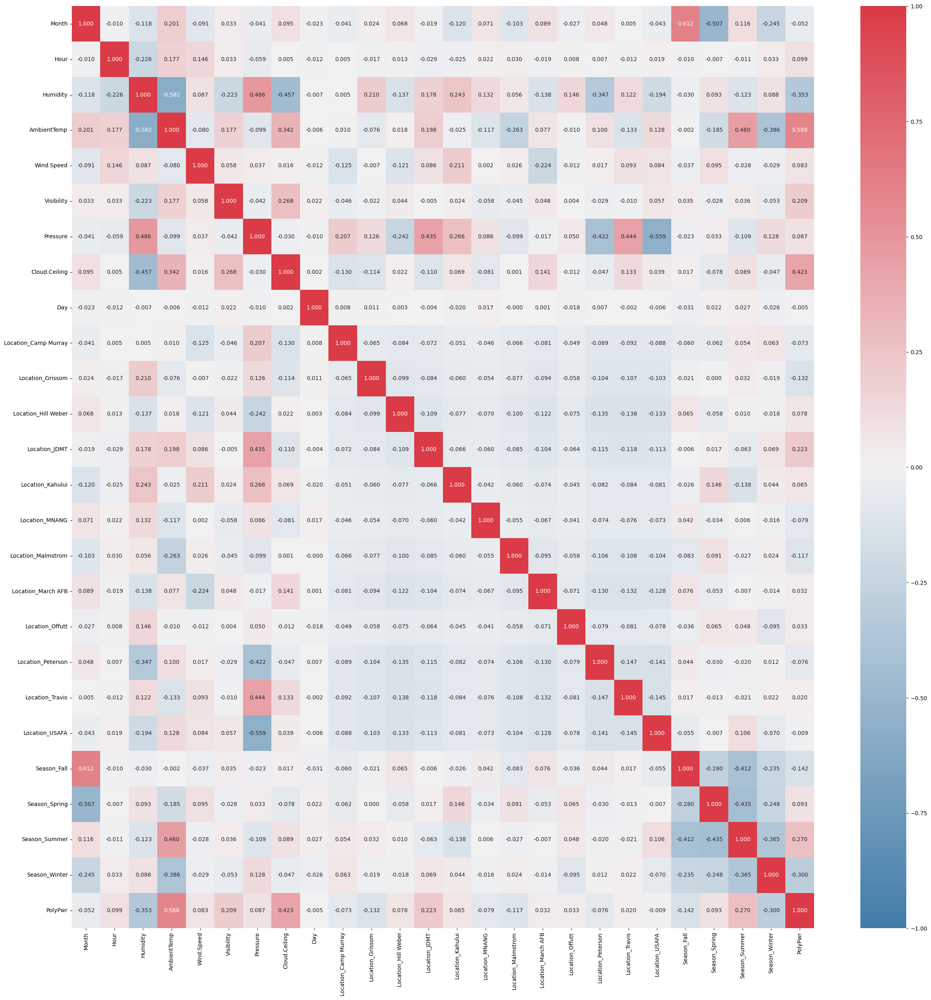

In [38]:
# Heatmap (corr spearman)
plt.figure(figsize=(30,30))
cmap_custom = sns.diverging_palette(240, 10, as_cmap=True)
sns.heatmap(data = df_encoding.corr(numeric_only=True, method='spearman'), cmap=cmap_custom, annot=True, fmt='.3f', vmin=-1, vmax=1)
plt.show()

In [39]:
# Create temporary dataframe for testing SelectKBest

df_feature_target_relation = df_encoding.copy()
df_feature_target_relation.head()

,Month,Hour,Humidity,AmbientTemp,Wind.Speed,Visibility,Pressure,Cloud.Ceiling,Day,Location_Camp Murray,Location_Grissom,Location_Hill Weber,Location_JDMT,Location_Kahului,Location_MNANG,Location_Malmstrom,Location_March AFB,Location_Offutt,Location_Peterson,Location_Travis,Location_USAFA,Season_Fall,Season_Spring,Season_Summer,Season_Winter,PolyPwr
0,12,11,81.71997,12.86919,5,10.0,1010.6,722,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2.42769
1,12,13,96.64917,9.66415,0,10.0,1011.3,23,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2.46273
2,12,13,93.61572,15.44983,5,10.0,1011.6,32,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4.46836
3,12,12,77.21558,10.36659,5,2.0,1024.4,6,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1.65364
4,12,14,54.80347,16.85471,3,3.0,1023.7,9,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,6.57939


In [40]:
#Calculation of feature importance score to target (numerical/categorical feature - categorical target)

from sklearn.feature_selection import SelectKBest, mutual_info_regression

# Separate features and target variable
x_features_test = df_feature_target_relation.drop(columns=['PolyPwr'])  # Features
y_target_test = df_feature_target_relation['PolyPwr']  # Target variable

# Instantiate SelectKBest
k_best = SelectKBest(score_func=mutual_info_regression, k='all')  # Use 'all' to see scores for all features

# Fit and transform the data
x_selected_features = k_best.fit_transform(x_features_test, y_target_test)

# Get scores and feature names
feature_scores = k_best.scores_
feature_names = x_features_test.columns

# Create a DataFrame to display feature scores
feature_scores_df = pd.DataFrame({'Feature': feature_names, 'Score': feature_scores})
feature_scores_df = feature_scores_df.sort_values(by='Score', ascending=False)

# Display the feature scores
print(feature_scores_df)

                 Feature     Score
3            AmbientTemp  0.296633
6               Pressure  0.201605
0                  Month  0.193038
7          Cloud.Ceiling  0.165095
2               Humidity  0.161767
24         Season_Winter  0.092468
23         Season_Summer  0.072375
15    Location_Malmstrom  0.069747
12         Location_JDMT  0.062078
1                   Hour  0.061821
21           Season_Fall  0.038698
18     Location_Peterson  0.034535
10      Location_Grissom  0.034133
5             Visibility  0.033875
20        Location_USAFA  0.033833
11   Location_Hill Weber  0.030142
19       Location_Travis  0.028273
16    Location_March AFB  0.026338
9   Location_Camp Murray  0.025602
8                    Day  0.016992
22         Season_Spring  0.016560
4             Wind.Speed  0.014415
14        Location_MNANG  0.012540
13      Location_Kahului  0.011212
17       Location_Offutt  0.010641


As we can see that AmbientTemp still hold as the most important feature to target similar to what we got before, but interestingly the Pressure feature score is high this is different from what we got using df.corr(), we will analyze the result further in the modelling process

In [41]:
# # Select only relevant features

# df_model = df_encoding.copy()

# # Using all features
# selected_features = ['Month', 'Hour', 'Humidity', 'AmbientTemp', 'Wind.Speed', 'Visibility',
#                      'Pressure', 'Cloud.Ceiling', 'Day', 'Location_Camp Murray',
#                      'Location_Grissom', 'Location_Hill Weber', 'Location_JDMT',
#                      'Location_Kahului', 'Location_MNANG', 'Location_Malmstrom',
#                      'Location_March AFB', 'Location_Offutt', 'Location_Peterson',
#                      'Location_Travis', 'Location_USAFA', 'Season_Fall', 'Season_Spring',
#                      'Season_Summer', 'Season_Winter', 'PolyPwr']

# # Using features with high correlation only (top 10 from select kbest)
# selected_features = ['Month', 'Hour', 'Humidity', 'AmbientTemp',
#                      'Pressure', 'Cloud.Ceiling', 'Location_JDMT',
#                      'Location_Malmstrom', 'Season_Summer', 'Season_Winter', 'PolyPwr']

# df_model = df_model[selected_features]
# df_model.sample(5)

Feature     Score
3            AmbientTemp  0.296641
6               Pressure  0.201022
0                  Month  0.193902
7          Cloud.Ceiling  0.164230
2               Humidity  0.161456
24         Season_Winter  0.093413
23         Season_Summer  0.073100
15    Location_Malmstrom  0.068628
12         Location_JDMT  0.062617
1                   Hour  0.060982
21           Season_Fall  0.038871
18     Location_Peterson  0.034669
10      Location_Grissom  0.034302
5             Visibility  0.033428
20        Location_USAFA  0.031959
11   Location_Hill Weber  0.029751
19       Location_Travis  0.027573
9   Location_Camp Murray  0.025987
16    Location_March AFB  0.025222
22         Season_Spring  0.017514
8                    Day  0.016955
4             Wind.Speed  0.014253
14        Location_MNANG  0.014092
13      Location_Kahului  0.012088
17       Location_Offutt  0.010754

# Train-Test Split

In [42]:
# Spliting data into train-test
x = df_encoding.drop(columns=['PolyPwr'])
y = df_encoding[['PolyPwr']]

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# Handling Outliers

It is generally recommended to handle outliers based on the training data only. The reason for this is to simulate real-world conditions during the testing phase. Handling outliers in the test set could potentially distort the evaluation of the model's performance on unseen data.

Here's the typical process:

1. **Handling outliers in the training data:** Identify and handle outliers using methods like IQR (Interquartile Range) or Z-score on the training dataset. This helps the model learn from a cleaner dataset and improves its generalization.

2. **Applying the same transformation to the test data:** Use the same parameters (like median and standard deviation for Z-score) obtained from the training data to handle outliers in the test data. This ensures consistency and reflects the real-world scenario where the model encounters new, unseen data with potential outliers.

By following this approach, you are testing the model on data that resembles what it might encounter in the real world, including outliers. This provides a more accurate assessment of how well the model generalizes to new, unseen data.

In [43]:
#Make temporary dataframe of features and target for train set
df_train_handling_outliers = pd.concat([x_train, y_train], axis='columns')

In [44]:
columns_to_handle_outliers = ['AmbientTemp', 'Wind.Speed', 'Visibility']

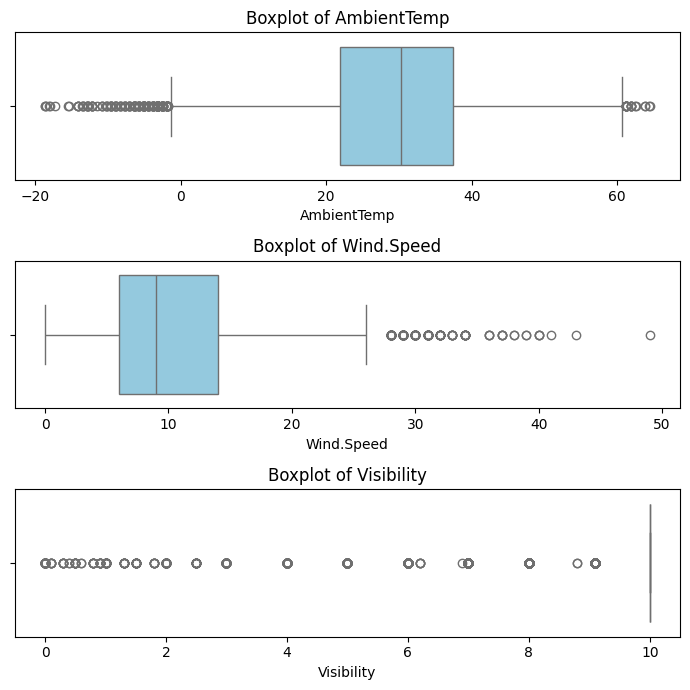

In [45]:
# Boxplot before handling outliers
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(7, 7))
axes = axes.flatten()

for i in range(len(columns_to_handle_outliers)) :
  sns.boxplot(ax=axes[i], x=df_train_handling_outliers[columns_to_handle_outliers[i]], orient='h', color='skyblue')
  axes[i].set_title(f'Boxplot of {columns_to_handle_outliers[i]}')


# Remove the last subplot if there are fewer features than subplots
if len(columns_to_handle_outliers) < len(axes):
    axes[len(columns_to_handle_outliers)].remove()

plt.tight_layout()

In [46]:
# Remove outliers with IQR method

print(f'The number of rows before filtering out outliers : {len(df_train_handling_outliers)}')

filtered_entries = np.array([True] * len(df_train_handling_outliers))

# Select features with outliers
for col in columns_to_handle_outliers:

    Q1 = df_train_handling_outliers[col].quantile(0.25)
    Q3 = df_train_handling_outliers[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - (IQR * 1.5)
    upper_bound = Q3 + (IQR * 1.5)

    filtered_entries = ((df_train_handling_outliers[col] >= lower_bound) & (df_train_handling_outliers[col] <= upper_bound)) & filtered_entries

df_train_handling_outliers = df_train_handling_outliers[filtered_entries]

print(f'The number of rows after filtering out outliers: {len(df_train_handling_outliers)}')

The number of rows before filtering out outliers : 14731
The number of rows after filtering out outliers: 13478


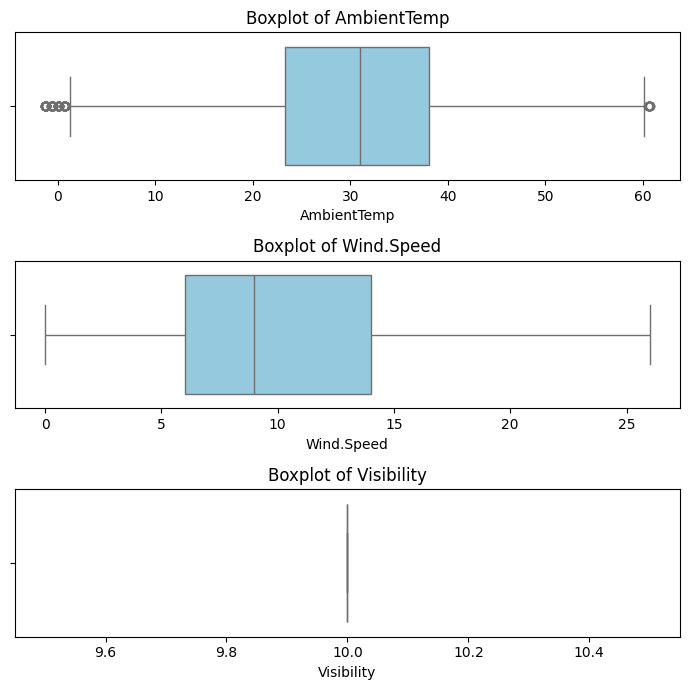

In [47]:
# Boxplot after handling outliers
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(7, 7))
axes = axes.flatten()

for i in range(len(columns_to_handle_outliers)) :
  sns.boxplot(ax=axes[i], x=df_train_handling_outliers[columns_to_handle_outliers[i]], orient='h', color='skyblue')
  axes[i].set_title(f'Boxplot of {columns_to_handle_outliers[i]}')


# Remove the last subplot if there are fewer features than subplots
if len(columns_to_handle_outliers) < len(axes):
    axes[len(columns_to_handle_outliers)].remove()

plt.tight_layout()

In [48]:
#Split the features and target for train set again
x_train = df_train_handling_outliers.drop(columns='PolyPwr')
y_train = df_train_handling_outliers['PolyPwr']

# Feature Scaling

Scaling will be done to train and test data

In [49]:
x_train

,Month,Hour,Humidity,AmbientTemp,Wind.Speed,Visibility,Pressure,Cloud.Ceiling,Day,Location_Camp Murray,Location_Grissom,Location_Hill Weber,Location_JDMT,Location_Kahului,Location_MNANG,Location_Malmstrom,Location_March AFB,Location_Offutt,Location_Peterson,Location_Travis,Location_USAFA,Season_Fall,Season_Spring,Season_Summer,Season_Winter
13683,9,15,52.72217,18.71025,8,10.0,814.5,34,26,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0
6340,2,11,44.03687,35.53352,17,10.0,1023.7,722,24,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
2820,7,10,31.54907,31.59836,14,10.0,856.9,722,28,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
6427,3,13,36.07178,33.56720,17,10.0,1008.8,37,12,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
20948,9,14,25.37231,39.40575,13,10.0,807.8,32,6,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,8,14,25.92163,35.43030,8,10.0,960.1,722,26,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
11964,8,15,60.22949,28.32787,14,10.0,984.9,60,16,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
5390,8,12,42.46216,42.57805,5,10.0,1019.3,722,2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
860,8,10,60.41870,24.49341,3,10.0,1010.9,18,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [50]:
x_test

,Month,Hour,Humidity,AmbientTemp,Wind.Speed,Visibility,Pressure,Cloud.Ceiling,Day,Location_Camp Murray,Location_Grissom,Location_Hill Weber,Location_JDMT,Location_Kahului,Location_MNANG,Location_Malmstrom,Location_March AFB,Location_Offutt,Location_Peterson,Location_Travis,Location_USAFA,Season_Fall,Season_Spring,Season_Summer,Season_Winter
20644,7,11,35.69336,34.77318,7,10.0,805.6,24,27,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
20802,8,15,10.96802,58.63594,10,10.0,804.5,120,16,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
6836,11,13,71.70410,25.25124,18,10.0,1014.8,70,15,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
5865,11,13,36.25488,41.87813,3,10.0,1012.8,722,22,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
7628,5,14,53.44849,31.05705,21,10.0,1014.8,722,31,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2359,8,10,84.39941,26.43456,6,10.0,984.9,722,17,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
673,7,12,17.24243,43.85704,10,10.0,1011.3,722,11,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
12659,6,15,99.98779,23.30254,17,10.0,972.2,12,25,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
13138,6,15,22.19238,28.33542,7,10.0,816.2,160,30,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0


In [51]:
len(x_train.columns)

25

**Additional Reminder About Feature Scalling**

When the original distribution is right-skewed, meaning that the majority of the data is concentrated on the left side with a long tail to the right, it's often more appropriate to use transformations that are less sensitive to extreme values. In this case, Min-Max scaling may be a better choice than Z-score normalization.

Here's a brief explanation:

1. **Min-Max Scaling:**
   - Scales the data to a specific range (e.g., between 0 and 1).
   - Less affected by outliers compared to Z-score normalization.
   - Suitable when the distribution is not normal and skewed.

2. **Z-score Normalization (Standardization):**
   - Centers the data around the mean and scales it by the standard deviation.
   - Can be sensitive to outliers, and right-skewed distributions may have extreme values that influence the scaling.
   - More appropriate when the data is approximately normally distributed.

Given a right-skewed distribution, Min-Max scaling is often a better choice as it allows the preservation of the skewed shape of the distribution and avoids amplifying the impact of outliers. However, the choice may also depend on the specific characteristics of your data and the requirements of your modeling task. If your data has extreme outliers, you might also consider other robust scaling methods.

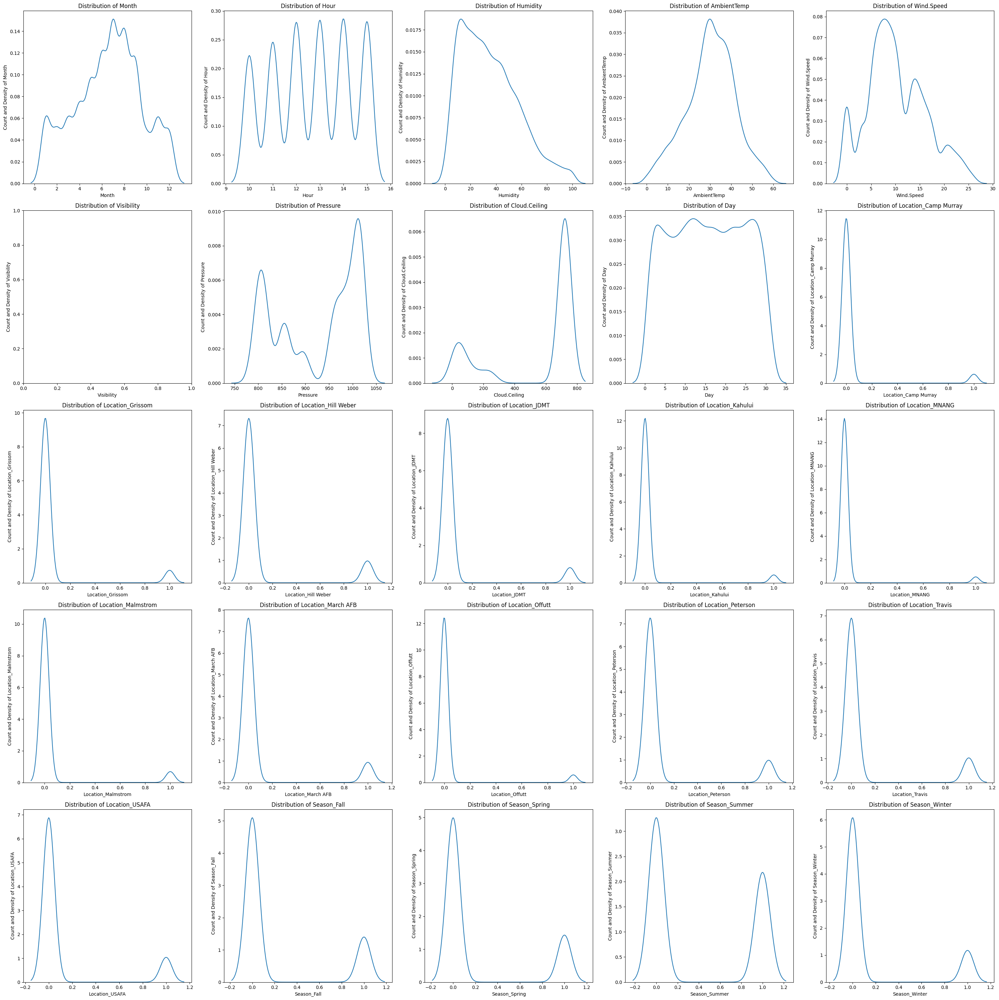

In [52]:
# Checking distribution before scaling
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(30,30))
axes = axes.flatten()

for i in range(len(x_train.columns)) :
    sns.kdeplot(ax=axes[i], x=x_train[x_train.columns[i]])
    axes[i].set_title(f'Distribution of {x_train.columns[i]}')
    axes[i].set_ylabel(f'Count and Density of {x_train.columns[i]}')
    axes[i].set_xlabel(f'{x_train.columns[i]}')

# Remove the last subplot if there are fewer features than subplots
if len(x_train.columns) < len(axes) :
    axes[len(x_train.columns)].remove()

plt.tight_layout()

**Additional thing to remember about scaling multi-modal distribution**

- When dealing with features that have a multi-modal distribution, like the hour feature you mentioned with values [10, 11, 12, 13, 14, 15], scaling might not be as crucial as it is for some other types of data. Scaling is typically more important when working with algorithms that are sensitive to the scale of the input features, such as distance-based algorithms (e.g., k-nearest neighbors) or optimization algorithms (e.g., gradient descent).

- For categorical features like hours of the day, you might consider using techniques like one-hot encoding or ordinal encoding, depending on the nature of the data and the specific machine learning algorithm you plan to use. One-hot encoding represents each category as a binary column, while ordinal encoding assigns integer values based on the order of the categories.

- If you still want to scale the feature for some reason, you can use techniques like Min-Max scaling or Z-score normalization. However, keep in mind that the choice of scaling method might depend on the characteristics of your data and the requirements of your specific machine learning model. Since the hour feature has a limited range, scaling might not have a significant impact on its distribution. Always consider the context and the characteristics of your data when deciding whether or not to scale a particular feature.

In [53]:
x_train.columns

Index(['Month', 'Hour', 'Humidity', 'AmbientTemp', 'Wind.Speed', 'Visibility',
       'Pressure', 'Cloud.Ceiling', 'Day', 'Location_Camp Murray',
       'Location_Grissom', 'Location_Hill Weber', 'Location_JDMT',
       'Location_Kahului', 'Location_MNANG', 'Location_Malmstrom',
       'Location_March AFB', 'Location_Offutt', 'Location_Peterson',
       'Location_Travis', 'Location_USAFA', 'Season_Fall', 'Season_Spring',
       'Season_Summer', 'Season_Winter'],
      dtype='object')

We will do scaling for non-binary features that we got in encoding process, so we will do this on Humidity, AmbientTemp, Wind.Speed, Visibility, Pressure, and Cloud.Ceiling

In [54]:
# #Normalization (MinMaxScaller)
# from sklearn.preprocessing import MinMaxScaler
# ms = MinMaxScaler()

# columns_to_scale = ['Income', 'Age', 'Experience', 'Income_Age_Ratio', 'Profession', 'City', 'State'] #pilih kolom tertentu untuk dilakukan scaling (sesuai keterangan mentor)
# # columns_to_scale = x_train.columns.to_list() #pilih semua kolom

# scale_features = x_train[columns_to_scale]
# for n in scale_features:
#   x_train[n] = ms.fit_transform(x_train[[n]])
#   x_test[n] = ms.fit_transform(x_test[[n]])
#   # scaler.to_pickle(filename)

In [55]:
#Standardization (Z-score normalization)
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()

columns_to_scale = ['Humidity', 'AmbientTemp', 'Wind.Speed', 'Visibility', 'Pressure', 'Cloud.Ceiling']

scale_features = x_train[columns_to_scale]
for n in scale_features:
  x_train[n] = ss.fit_transform(x_train[[n]])
  x_test[n] = ss.fit_transform(x_test[[n]])
  # scaler.to_pickle(filename)

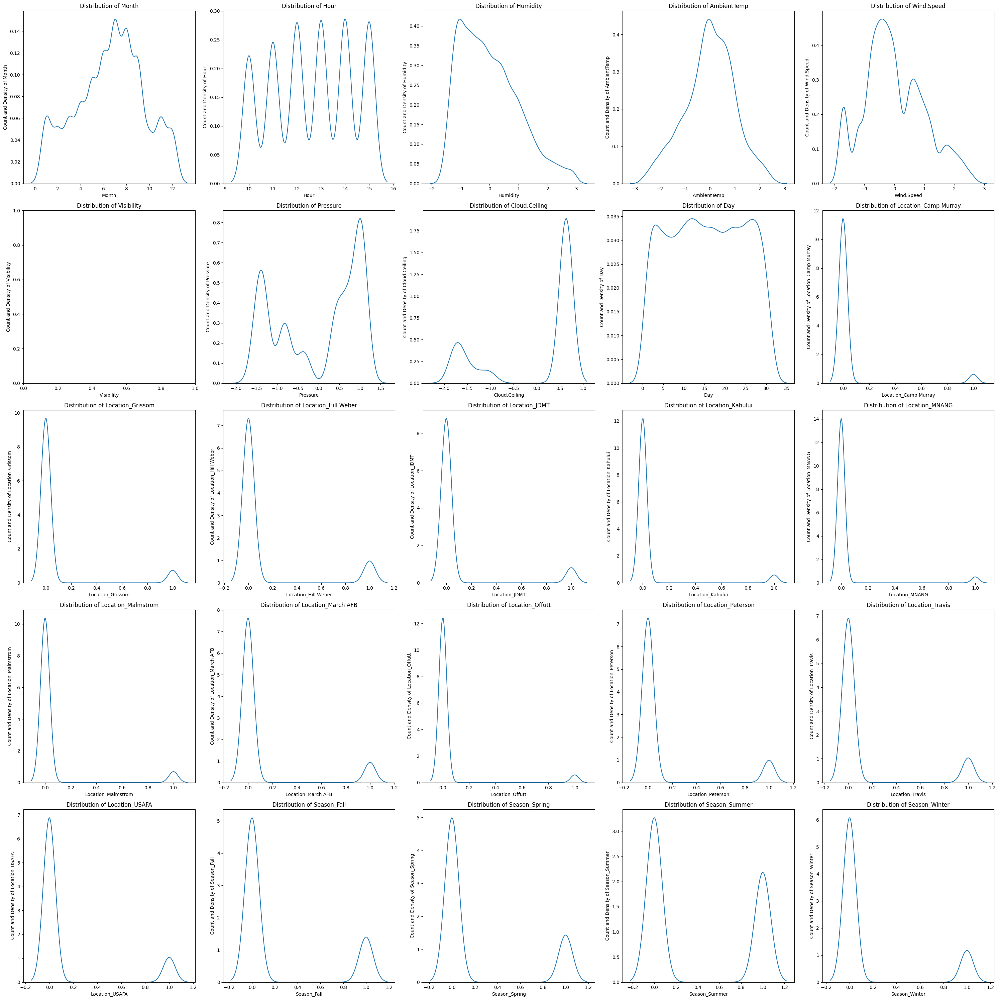

In [56]:
# Checking distribution before scaling
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(30,30))
axes = axes.flatten()

for i in range(len(x_train.columns)) :
    sns.kdeplot(ax=axes[i], x=x_train[x_train.columns[i]])
    axes[i].set_title(f'Distribution of {x_train.columns[i]}')
    axes[i].set_ylabel(f'Count and Density of {x_train.columns[i]}')
    axes[i].set_xlabel(f'{x_train.columns[i]}')

# Remove the last subplot if there are fewer features than subplots
if len(x_train.columns) < len(axes) :
    axes[len(x_train.columns)].remove()

plt.tight_layout()

# Modelling

## Train Regression Models

In [57]:
len(x_train)

13478

In [58]:
len(y_train)

13478

In [59]:
len(x_test)

6314

In [60]:
len(y_test)

6314

In [61]:
# Linear Regression
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(x_train, y_train)

LinearRegression()

In [62]:
# Ridge Regression
from sklearn.linear_model import Ridge
ridge = Ridge()
ridge.fit(x_train, y_train)

Ridge()

In [63]:
# Lasso Regression
from sklearn.linear_model import Lasso
lasso = Lasso()
lasso.fit(x_train, y_train)

Lasso()

In [64]:
# Elastic Net Regression
from sklearn.linear_model import ElasticNet
elasticnet = ElasticNet()
elasticnet.fit(x_train, y_train)

ElasticNet()

In [65]:
# Decision Tree
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor()
dt.fit(x_train, y_train)

DecisionTreeRegressor()

In [66]:
# Random Forest
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(x_train, y_train)

RandomForestRegressor()

In [67]:
# Support Vector Regression
from sklearn.svm import SVR
svr = SVR()
svr.fit(x_train, y_train)

SVR()

In [68]:
# Boosting : AdaBoost Regression
from sklearn.ensemble import AdaBoostRegressor
ab = AdaBoostRegressor()
ab.fit(x_train, y_train)

AdaBoostRegressor()

In [69]:
# Boosting : XGBoost Regression
from xgboost import XGBRegressor
xg = XGBRegressor()
xg.fit(x_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

## Model Evaluation

In [70]:
#Import metrics score that will be evalueated
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.model_selection import cross_validate

#Function for model evaluation metrics score
def eval_regression(model):
  y_pred = model.predict(x_test)
  y_pred_train = model.predict(x_train)

  # print('MAE (train): ' + str(mean_absolute_error(y_test, y_pred_train)))
  print('MAE (test): ' + str(mean_absolute_error(y_test, y_pred)))

  # print('RMSE (train): ' + str(mean_squared_error(y_train, y_pred_train, squared=False)))
  print('RMSE (test): ' + str(mean_squared_error(y_test, y_pred, squared=False)))

  # print('MAPE (train): ' + str(mean_absolute_percentage_error(y_train, y_pred_train)))
  print('MAPE (test): ' + str(mean_absolute_percentage_error(y_test, y_pred)))

  # print('R2 (train): ' + str(r2_score(y_train, y_pred_train)))
  print('R2 (test): ' + str(r2_score(y_test, y_pred)))

  #Cross Validation
  score = cross_validate(model, x_train, y_train, cv=5, scoring='r2', return_train_score=True) #scoring change based on what metrics we want to validate (usually choose the main performance metric)
  print('R2 Score (crossval train): '+ str(score['train_score'].mean()))
  print('R2 Score (crossval test): '+ str(score['test_score'].mean()))


In [71]:
#Printing metrics score for all models to compare

#Linear Regression
print('\nEvaluate LinearRegression')
eval_regression(lr)

#Ridge Regressor
print('\nEvaluate RidgeRegression')
eval_regression(ridge)

#Lasso Regressor
print('\nEvaluate LassoRegression')
eval_regression(lasso)

#Elastic Net Regressor
print('\nEvaluate ElasticNetRegression')
eval_regression(elasticnet)

#Decision Tree Regressor
print('\nEvaluate DecisionTreeRegressor')
eval_regression(dt)

#Random Forest Regressor
print('\nEvaluate RandomForestRegressor')
eval_regression(rf)

#Support Vector Regressor
print('\nEvaluate SVR')
eval_regression(svr)

#AdaBoost Regressor
print('\nEvaluate AdaBoostRegressor')
eval_regression(ab)

#XGBoost Regressor
print('\nEvaluate XGBRegressor')
eval_regression(xg)


Evaluate LinearRegression
MAE (test): 384381546.524225
RMSE (test): 945221831.907305
MAPE (test): 86652247.62650523
R2 (test): -1.7543422302307984e+16
R2 Score (crossval train): 0.5177048868047509
R2 Score (crossval test): 0.5151032534046467

Evaluate RidgeRegression
MAE (test): 3.751564913417885
RMSE (test): 4.858690379110894
MAPE (test): 0.7462236822183446
R2 (test): 0.5364620683067971
R2 Score (crossval train): 0.5176805200875897
R2 Score (crossval test): 0.5151402353083381

Evaluate LassoRegression
MAE (test): 4.6882551430698856
RMSE (test): 5.688823349184978
MAPE (test): 0.9882354878297834
R2 (test): 0.3645348676722173
R2 Score (crossval train): 0.3380819978816506
R2 Score (crossval test): 0.3373951566072594

Evaluate ElasticNetRegression
MAE (test): 4.751806881550843
RMSE (test): 5.724012791409402
MAPE (test): 1.009868685235081
R2 (test): 0.35664893990605684
R2 Score (crossval train): 0.3314709352581079
R2 Score (crossval test): 0.33041433150166594

Evaluate DecisionTreeRegresso

### Feature Importance in Linear Models

In [72]:
#Check features
x_train.columns

Index(['Month', 'Hour', 'Humidity', 'AmbientTemp', 'Wind.Speed', 'Visibility',
       'Pressure', 'Cloud.Ceiling', 'Day', 'Location_Camp Murray',
       'Location_Grissom', 'Location_Hill Weber', 'Location_JDMT',
       'Location_Kahului', 'Location_MNANG', 'Location_Malmstrom',
       'Location_March AFB', 'Location_Offutt', 'Location_Peterson',
       'Location_Travis', 'Location_USAFA', 'Season_Fall', 'Season_Spring',
       'Season_Summer', 'Season_Winter'],
      dtype='object')

In [73]:
#Initialize series of coef
lr_coef = pd.Series(lr.coef_)
ridge_coef = pd.Series(ridge.coef_)
lasso_coef = pd.Series(lasso.coef_)
elasticnet_coef = pd.Series(elasticnet.coef_)

# Creating a DataFrame with coefficients
linear_model_coef = pd.DataFrame({'lr_coef': lr_coef, 'ridge_coef': ridge_coef, 'lasso_coef': lasso_coef, 'elasticnet_coef': elasticnet_coef})

# Display coef DataFrame
linear_model_coef

,lr_coef,ridge_coef,lasso_coef,elasticnet_coef
0,-2.563231e-01,-0.251551,-0.185055,-0.196694
1,4.963332e-03,0.003565,0.000000,0.000000
2,-1.508298e+00,-1.511432,-0.000000,-0.385370
3,2.126144e+00,2.121174,2.685373,2.007763
4,5.332358e-01,0.522757,0.000000,0.112325
5,9.452218e+08,0.000000,0.000000,0.000000
6,4.501288e+00,3.843469,0.000000,0.349403
7,1.395113e+00,1.396503,0.859078,0.930547
8,-1.096198e-02,-0.011065,-0.000000,-0.000096
9,1.460481e+10,-4.295763,-0.000000,-0.000000


# Summary of Models Generated by Various Machine Learning Algorithms

Experiment was conducted on the models below :

1. Linear Regression (with regularization : Ridge, Lasso, and Elastic Net)
2. Decision Tree Regression
3. Random Forest Regression
4. Support Vector Regression
5. Gradient Boosting Regression (AdaBoost and XGBoost)

From all of the models, the best results were obtained by:

- **Random Forest Regression**
- **XGBoost Regression**

Therefore, hyperparameter tuning can be applied to these two models to slightly improve their results (for other models that also have decent performance, experiments will be conducted if there is time and additional resources available).

## Feature Importances from Regression Models

In [74]:
#Function for model feature importance score
def show_feature_importance(model):
    feat_importances = pd.Series(model.feature_importances_, index=x.columns)
    ax = feat_importances.nlargest(25).plot(kind='barh', figsize=(10, 8))
    ax.invert_yaxis()

    plt.xlabel('Score')
    plt.ylabel('Feature')
    plt.title('Feature importance score')

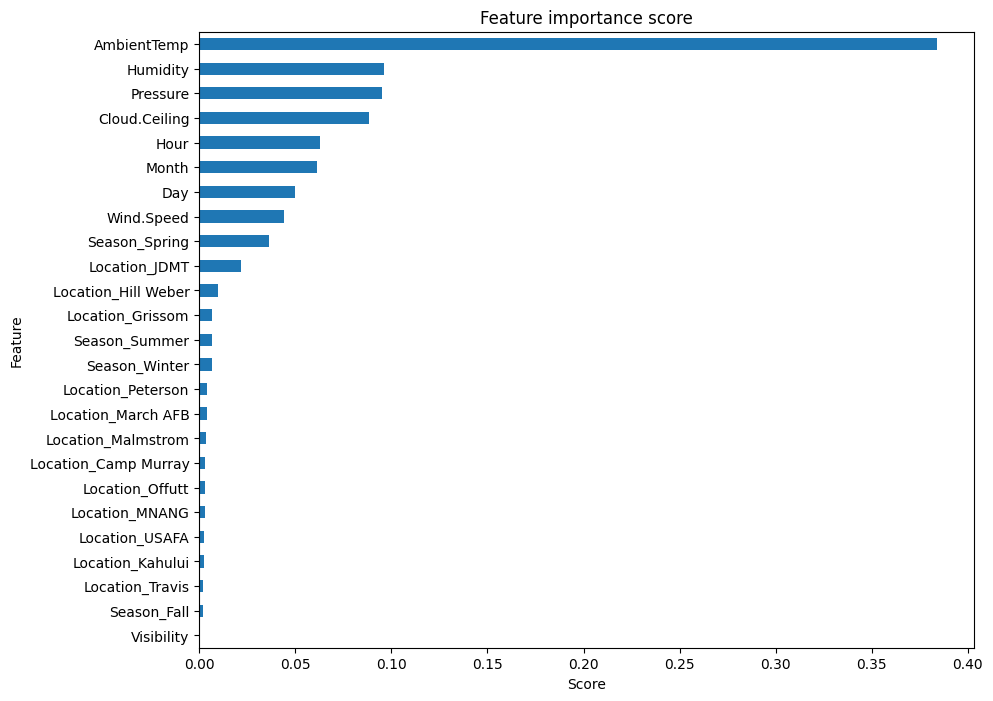

In [75]:
# Feature importance in random forest
show_feature_importance(rf)

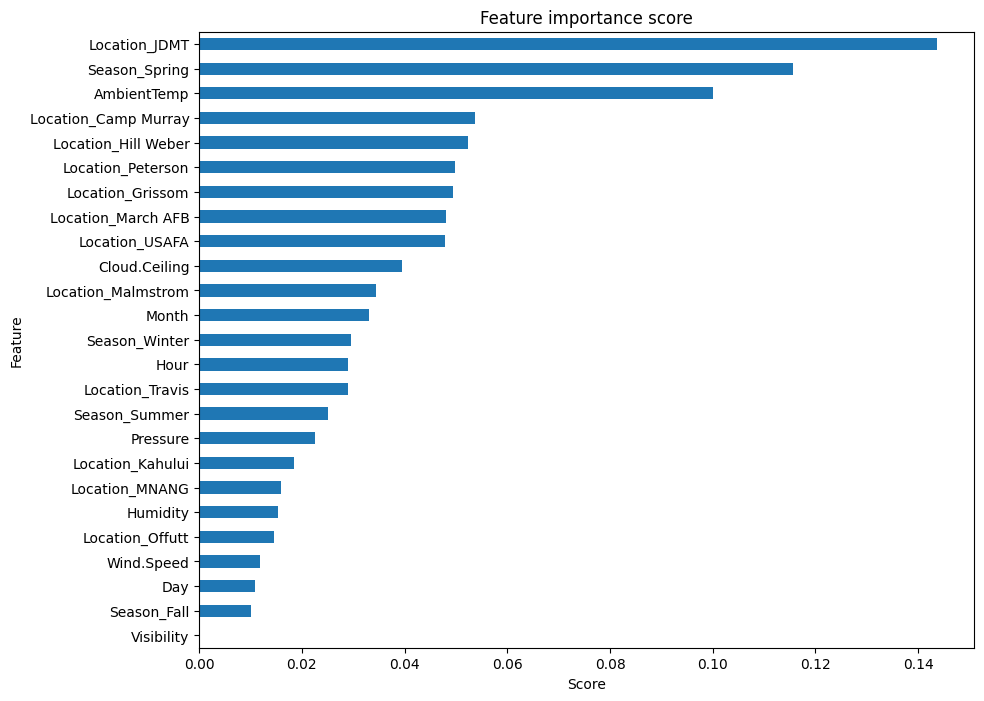

In [76]:
# Feature importance in XGB
show_feature_importance(xg)

## Hyperparameter Tuning

In [77]:
#Function for best hyperparameters found during the tuning process
def show_best_hyperparameter(model):
    print(model.best_estimator_.get_params())

### Hyperparameter Tuning For Random Forest Regression

<b>Commonly tuned hyperparameters in Random Forest:</b> (<a href='https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html'>Sklearn Random Forest Documentation</a>)

- n_estimators: the number of trees to be built in the forest.
- max_samples: the maximum number of samples to be drawn from the total training set for building each tree (after the bootstrap process).

The remaining hyperparameters are the same as in Decision Trees:

- criterion: the method used to measure impurity in features (gini, entropy). This is for classification; for regression, it's different. It determines which feature becomes the root/node (squared_error, poisson).
- max_depth: the maximum depth of each tree to prevent overfitting.
- min_sample_split: the minimum number of samples required at a node to create a new leaf (to avoid having too few samples, which can lead to overfitting).
- min_sample_leaf: the minimum number of samples required in a leaf for the leaf to be formed (to avoid having too few samples, which can lead to overfitting).
- ccp_alpha: if the cost/error of a leaf/subtree is greater than ccp_alpha, that subtree will be pruned, minimizing the error/variance of the model.

In [78]:
# Hyperparameter Tuning for random forest
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

#Initiate hyperparameters used and their values
n_estimators = [int(x) for x in np.linspace(1, 200, 50)]
criterion = ['squared_error', 'poisson']
max_depth = [int(x) for x in np.linspace(50, 180, 5)]
min_samples_split = [2, 5, 10, 50]
min_samples_leaf = [1, 2, 5, 8, 20, 30] 

#Collecting all hyperparameters into a single dictionary
hyperparameters = dict(n_estimators=n_estimators, 
                       criterion=criterion, 
                       max_depth=max_depth,
                       min_samples_split=min_samples_split,
                       min_samples_leaf=min_samples_leaf)

#Initiate tuned model
rf = RandomForestRegressor()
# rf_tuned = GridSearchCV(dt, hyperparameters, cv=5, scoring='r2')
rf_tuned = RandomizedSearchCV(rf, hyperparameters, scoring='r2', cv=5, error_score='raise')
rf_tuned.fit(x_train, y_train)

#Tuned model evaluation
eval_regression(rf_tuned)

MAE (test): 2.8436943639319505
RMSE (test): 4.209792375265601
MAPE (test): 0.5632686247253577
R2 (test): 0.652008862150371
R2 Score (crossval train): 0.8931673590139722
R2 Score (crossval test): 0.6325874691103577


In [79]:
# Best hyperparameter in random forest
show_best_hyperparameter(rf_tuned)

{'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'poisson', 'max_depth': 180, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 2, 'min_samples_split': 5, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 82, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


In [80]:
# Retrieving the best hyperparameters for random forest (similar to show_best_hyperparameter code before, but only shows the ones that we used)
best_params = rf_tuned.best_params_
best_params

{'n_estimators': 82,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_depth': 180,
 'criterion': 'poisson'}

In [81]:
# #Learning curve for hyperparameters

# # Hyperparameter that will be tested and their values (can be found in best hyperparameter before or experiment with others)
# # param_values = [int(x) for x in np.linspace(50, 180, 5)] # n_estimators
# # param_values = [int(x) for x in np.linspace(50, 180, 5)] # max_depth
# # param_values = [int(x) for x in np.linspace(2, 10, 2)] # min_samples_split
# param_values = [int(x) for x in np.linspace(2, 10, 2)] # min_samples_leaf

# train_scores = []
# test_scores = []

# for i in param_values:
#     model = RandomForestRegressor(min_samples_leaf=i) # Change based on what hyperparameter that we used
#     model.fit(x_train, y_train)

#     # eval on train
#     y_pred_train_proba = model.predict_proba(x_train)
#     train_r2 = r2_score(y_train, y_pred_train_proba[:,1])
#     train_scores.append(train_r2)

#     # eval on test
#     y_pred_proba = model.predict_proba(x_test)
#     test_r2 = r2_score(y_test, y_pred_proba[:,1])
#     test_scores.append(test_r2)

#     print('Param value: ' + str(i) + '; train: ' + str(train_r2) + '; test: '+ str(test_r2))

# plt.title('Learning Curve | Hyperparameter : min_sample_leaf | Random Forest') # Change based on what hyperparameter that we used
# plt.ylabel('R2 Score')
# plt.xlabel('min_sample_leaf') # Change based on what hyperparameter that we used
# plt.plot(param_values, train_scores, label='Train')
# plt.plot(param_values, test_scores, label='Test')
# plt.legend()
# plt.show()

### Hyperparameter Tuning For XGBoost Regression

<b>Commonly tuned hyperparameters in XGBoost:</b>  (<a href='https://xgboost.readthedocs.io/en/latest/parameter.html'>XGBoost Documentation</a>)

- <b>Tree architecture-related:</b>
    - max_depth: the maximum depth of the tree to prevent overfitting.
    - min_child_weight: the minimum weight (or the number of samples if the total weight equals 1) a node should have to create a new leaf (to avoid having too few, causing overfitting).
    - gamma: the minimum loss/error reduction required to make a new leaf.
    - tree_method: the method XGBoost uses to build a tree. The algorithm we are learning is tree_method = exact. Other references can be found <a href='https://xgboost.readthedocs.io/en/latest/treemethod.html'>here</a>.

- <b>Boosting process subsampling:</b> Instead of using the entire training data in each iteration, we can use a sample in each iteration.
    - subsample: how much of the row samples to be used for sampling at each step. 1 for all rows.
    - colsample_bytree: how many features to be used. 1 for all features.

- <b>Control learning rate:</b>
    - eta: the step size for updating the feature weight in XGBoost, value range: 0-1. Smaller eta provides more fine-grained corrections but requires more boosting iterations.
        - In sklearn, the hyperparameter name is learning_rate.

- <b>Regularization in XGBoost:</b>
    - lambda: the regularization term on L2 norm.
    - alpha: the regularization term on L1 norm.

- <b>Learning task in XGBoost:</b>
    - objective: the objective function used, such as calculating error in regression.
    - eval_metric: evaluation metrics used on the validation data (e.g., rmse, mae, auc).
    - seed: random state.

- <b>Others:</b>
    - scale_pos_weight: if the data is imbalanced, this parameter is used to adjust the weight of each label.
    
- <b>Other parameters for model checking and debugging:</b>
    - verbose: to display detailed log information during the model training. 0: no messages; 1: display warnings only; 2: display info (deprecated examples); 3: debug: detailed training information for the model.

In [86]:
#Hyperparameter tuning for xgb
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

#Initiate hyperparameters used and their values
max_depth = [int(x) for x in np.linspace(5, 20, 11)]
min_child_weight = [int(x) for x in np.linspace(1, 20, 11)]
gamma = [float(x) for x in np.linspace(0, 3, num = 11)]
tree_method = ['auto', 'exact', 'approx']

colsample_bytree = [float(x) for x in np.linspace(0, 1, 11)]
eta = [float(x) for x in np.linspace(0, 1, num = 100)]

# lambda = [float(x) for x in np.linspace(0, 1, 11)]
alpha = [float(x) for x in np.linspace(0, 1, 11)]

#Collecting all hyperparameters into a single dictionary
hyperparameters = dict(max_depth=max_depth, 
                       min_child_weight=min_child_weight, 
                       gamma=gamma,
                       tree_method=tree_method,
                       colsample_bytree=colsample_bytree,
                       eta=eta,
                       alpha=alpha)

#Initiate tuned model
xg = XGBRegressor()
# xg_tuned = GridSearchCV(xg, hyperparameters, cv=5, scoring='r2')
xg_tuned = RandomizedSearchCV(xg, hyperparameters, scoring='r2', cv=5, error_score='raise')
xg_tuned.fit(x_train,y_train)

# Evaluation
eval_regression(xg_tuned)

MAE (test): 2.858064295764701
RMSE (test): 4.218963022847517
MAPE (test): 0.535744854162412
R2 (test): 0.6504910770512162
R2 Score (crossval train): 0.7981895681127092
R2 Score (crossval test): 0.6284883788517422


In [87]:
# Best hyperparameter in xgb
show_best_hyperparameter(xg_tuned)

{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.8, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 1.2, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': None, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 9, 'max_leaves': None, 'min_child_weight': 6, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': None, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': None, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': 'approx', 'validate_parameters': None, 'verbosity': None, 'eta': 0.19191919191919193, 'alpha': 0.8}


In [88]:
# Retrieving the best hyperparameters for xgb (similar to show_best_hyperparameter code before, but only shows the ones that we used)
best_params = xg_tuned.best_params_
best_params

{'tree_method': 'approx',
 'min_child_weight': 6,
 'max_depth': 9,
 'gamma': 1.2,
 'eta': 0.19191919191919193,
 'colsample_bytree': 0.8,
 'alpha': 0.8}

In [89]:
# #Learning curve for hyperparameters

# # Hyperparameter that will be tested and their values (can be found in best hyperparameter before or experiment with others)
# # param_values = [int(x) for x in np.linspace(5, 20, 11)] #max_depth
# # param_values = [int(x) for x in np.linspace(1, 20, 11)] #min_child_weight
# # param_values = [float(x) for x in np.linspace(0, 3, num = 11)] #gamma
# # param_values = ['auto', 'exact', 'approx'] #tree_method
# # param_values = [float(x) for x in np.linspace(0, 1, 11)] #colsample_bytree
# # param_values = [float(x) for x in np.linspace(0, 1, 100)] #eta
# # param_values = [float(x) for x in np.linspace(0, 1, 11)] #lambda
# param_values = [float(x) for x in np.linspace(0, 1, 11)] #alpha

# train_scores = []
# test_scores = []

# for i in param_values:
#     model = XGBRegressor(alpha=i) # Change based on what hyperparameter that we used
#     model.fit(x_train, y_train)

#     # eval on train
#     y_pred_train_proba = model.predict_proba(x_train)
#     train_r2 = r2_score(y_train, y_pred_train_proba[:,1])
#     train_scores.append(train_r2)

#     # eval on test
#     y_pred_proba = model.predict_proba(x_test)
#     test_r2 = r2_score(y_test, y_pred_proba[:,1])
#     test_scores.append(test_r2)

#     print('Param value: ' + str(i) + '; train: ' + str(train_r2) + '; test: '+ str(test_r2))

# plt.title('Learning Curve | Hyperparameter : alpha | XGB') # Change based on what hyperparameter that we used
# plt.ylabel('AUC')
# plt.xlabel('alpha') # Change based on what hyperparameter that we used
# plt.plot(param_values, train_scores, label='Train')
# plt.plot(param_values, test_scores, label='Test')
# plt.legend()
# plt.show()

# Comparison of Results Before and After Hyperparameter Tuning

<b>Evaluate RandomForestRegressor</b>

A. Before Hyperparameter Tuning
* MAE (test): 2.85103757187203
* RMSE (test): 4.200867868025909
* MAPE (test): 0.565500894347456
* R2 (test): 0.6534827388917007
* R2 Score (crossval train): 0.9485050194522723
* R2 Score (crossval test): 0.6299059314105596

B. After Hyperparameter Tuning
* MAE (test): 2.8436943639319505
* RMSE (test): 4.209792375265601
* MAPE (test): 0.5632686247253577
* R2 (test): 0.652008862150371
* R2 Score (crossval train): 0.8931673590139722
* R2 Score (crossval test): 0.6325874691103577

<b>Evaluate XGBRegressor</b>

A. Before Hyperparameter Tuning
* MAE (test): 2.9345514307685296
* RMSE (test): 4.26551875398415
* MAPE (test): 0.5539045880764762
* R2 (test): 0.6427349430738472
* R2 Score (crossval train): 0.8709527944245978
* R2 Score (crossval test): 0.6179286977843892

B. After Hyperparameter Tuning
* MAE (test): 2.858064295764701
* RMSE (test): 4.218963022847517
* MAPE (test): 0.535744854162412
* R2 (test): 0.6504910770512162
* R2 Score (crossval train): 0.7981895681127092
* R2 Score (crossval test): 0.6284883788517422

It does increse the R2 score even just a little but further tuning obviously still needs to be done, and we also have to experiment with other combination of features in training